# Table of Contents:

1. Introduction  
2. Import Libraries  
3. Rating Distribution  
4. Map Visualization  
    1. Global View  
    2. North America and Europe  
    3. City View (Las Vegas, Phoenix, Stuttgart, Edinburgh)  
    4. Las Vegas Ratings  
5. In-depth Review Analysis  
    1. Top 10 Review Users  
    2. Tracking Top Users  
    3. User Summary Statistics  
6. Registration Data  


## Introduction

Yelp is a company that provides crowdsourced reviews and online reservation services for local businesses. It was founded in 2004 by former PayPal employees. Yelp allows users to rate and review various types of local businesses on its platform, including restaurants, cafes, hotels, shops, and more. Users can use Yelp to explore others’ opinions and reviews, helping them make more informed consumption decisions.

The Yelp review dataset is a rich collection of review information gathered from the Yelp platform, including ratings, review texts, user information, and business information. By analyzing this data, we can gain insights into user opinions on various business types, uncover valuable patterns such as user preferences and business strengths or weaknesses, and provide targeted advice and recommendations to local businesses and users.

This project aims to analyze the Yelp review dataset to explore trends, patterns, and associations within the data, extracting valuable insights through visualizations, statistical analysis, and network analysis. Through this data analysis, we can gain a deeper understanding of user behavior, business conditions, and social networks within the Yelp review ecosystem, ultimately helping Yelp and its users make better decisions and offer improved services.


##Import Packages

In [1]:
%%writefile requirements.txt
basemap
googlemaps
gmaps
gmplot
datasets
nltk
skorch

Overwriting requirements.txt


In [2]:
!pip install -r requirements.txt

In [3]:
# Import basic packages
import numpy as np
import pandas as pd

# Import miscellaneous packages
import gc  # Garbage collection, for memory management
import time  # Time module, used for tracking execution time
import warnings  # Warning handling, used to filter out warning messages

# Import data visualization libraries
import matplotlib.pyplot as plt  # Matplotlib for static plots
import seaborn as sns  # Seaborn for statistical visualizations
import matplotlib.gridspec as gridspec  # Gridspec for complex plot layouts
import plotly.offline as pyo  # Plotly offline mode for interactive plots
from plotly.graph_objs import *  # Plotly graph objects for interactive plotting
import plotly.graph_objs as go  # Alternative import for Plotly graph objects

# Import map-related packages
import imageio  # Image processing library, used for handling map images
import folium  # Folium for interactive map creation
import folium.plugins as plugins  # Folium plugins for extra map functionality
from mpl_toolkits.basemap import Basemap  # Basemap for rendering maps

# Import graph/network packages
import networkx as nx  # NetworkX for building and analyzing graph networks
import heapq  # Heap queue for extracting top n elements from lists or dicts

# Settings
start_time = time.time()  # Record start time for timing code execution
color = sns.color_palette()  # Set color palette
sns.set_style("darkgrid")  # Set Seaborn plot style
warnings.filterwarnings("ignore")  # Ignore warning messages
pyo.init_notebook_mode()  # Initialize Plotly in notebook mode

## Dataset Overview

### `yelp_tip.csv`

This dataset contains tip information posted by Yelp users on business pages. The main fields include:

1. `user_id`: ID of the user who posted the tip  
2. `business_id`: ID of the business receiving the tip  
3. `text`: Content of the tip  
4. `date`: Date and time the tip was posted  
5. `compliment_count`: Number of compliments received for the tip  
6. `type`: Type of entry, usually "tip"  
7. `cool`: Number of "cool" votes the tip received  
8. `funny`: Number of "funny" votes the tip received  
9. `useful`: Number of "useful" votes the tip received  

These fields provide insights into user interactions on Yelp business pages, helping to analyze user feedback and improve services and recommendations.

---

### `yelp_business.csv`

This dataset includes business information listed on Yelp, with the following fields:

1. `business_id`: Unique identifier for the business  
2. `name`: Business name  
3. `address`: Business address  
4. `city`: City where the business is located  
5. `state`: State or province of the business  
6. `postal_code`: Postal code  
7. `latitude`: Latitude coordinate  
8. `longitude`: Longitude coordinate  
9. `stars`: Business rating (1 to 5 stars)  
10. `review_count`: Number of reviews  
11. `is_open`: Whether the business is open (1) or closed (0)  
12. `categories`: Business categories, separated by commas  
13. `attributes`: Additional business attributes (key-value pairs)  
14. `hours`: Business hours (key-value format)  

This dataset supports analysis of business performance, comparison of different businesses, and geographic insights into Yelp's ecosystem.

---

### `yelp_business_hours.csv`

This dataset includes business operating hours, with fields:

1. `business_id`: Business identifier (matches `yelp_business.csv`)  
2. `monday` to `sunday`: Operating hours for each day of the week  

Hours are typically in formats like "9:00-17:00". Empty fields indicate missing hours. This data can be used to analyze business operations and consumer activity trends by time.

---

### `yelp_checkin.csv`

This dataset contains check-in data, capturing when users visited businesses:

1. `business_id`: Business identifier (matches `yelp_business.csv`)  
2. `date`: Check-in date (YYYY-MM-DD)  
3. `time`: Check-in time (HH:MM:SS)  

It helps analyze user visit patterns, peak check-in times, and popularity of businesses based on temporal trends.

---

### `yelp_user.csv`

This dataset includes information about Yelp users:

1. `user_id`: Unique user identifier  
2. `name`: Username or nickname  
3. `review_count`: Number of reviews posted  
4. `yelping_since`: Join date (YYYY-MM-DD)  
5. `friends`: List of friend user IDs (comma-separated)  
6. `useful`: Total “useful” votes received  
7. `funny`: Total “funny” votes received  
8. `cool`: Total “cool” votes received  
9. `fans`: Number of followers  
10. `elite`: Elite status years (if any)  
11. `average_stars`: User's average rating  
12. `compliment_hot`: Number of “hot” compliments received  
13. `compliment_more`: Number of “more” compliments  
14. `compliment_profile`: Compliments on user profile  
15. `compliment_cute`: Compliments for being “cute”  
16. `compliment_list`: Compliments on lists created  
17. `compliment_note`: Compliments on notes  
18. `compliment_plain`: “Plain” compliments  
19. `compliment_cool`: “Cool” compliments  
20. `compliment_funny`: “Funny” compliments  
21. `compliment_writer`: Compliments for writing skills  
22. `compliment_photos`: Compliments on photos  

This dataset helps analyze user engagement, behavior, and reputation on Yelp.

In [4]:
from google.colab import drive

# 连接到Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
# Import necessary package
import pandas as pd  # Pandas for data processing

# Define dataset path
dataset_path = '/content/drive/MyDrive/Yelp data/'

# Load yelp_business.csv
business = pd.read_csv(dataset_path + "yelp_business.csv")  # Read data from CSV file using pd.read_csv()

# Load yelp_business_hours.csv
business_hours = pd.read_csv(dataset_path + "yelp_business_hours.csv")

# Load yelp_checkin.csv
check_in = pd.read_csv(dataset_path + "yelp_checkin.csv")

# Load yelp_review.csv
reviews = pd.read_csv(dataset_path + "yelp_review.csv")

# Load yelp_tip.csv
tip = pd.read_csv(dataset_path + "yelp_tip.csv")

# Load yelp_user.csv
user = pd.read_csv(dataset_path + "yelp_user.csv")

In [6]:
business

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,4.0,22,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,3.0,11,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1.5,18,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,3.0,9,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,3.5,116,1,American (New);Nightlife;Bars;Sandwiches;Ameri...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
174562,ALV5R8NkZ1KGOZeuZl3u0A,"""Whitby Toyota""",NaN,"""1025 Dundas Street W""",Whitby,ON,L1P 1Z1,43.873460,-78.968033,4.0,4,1,Car Dealers;Automotive
174563,gRGalHVu6BcaUDIAGVW_xQ,"""Village Auto Body""",NaN,"""3957 Brecksville Rd""",Richfield,OH,44286,41.243385,-81.636212,5.0,3,1,Body Shops;Automotive
174564,XXvZBIHoJBU5d6-a-oyMWQ,"""AAM""",NaN,"""1600 W Broadway Rd, Ste 200""",Tempe,AZ,85282,33.407914,-111.965098,1.5,19,1,Home Services;Property Management;Real Estate
174565,lNpPGgM96nPIYM1shxciHg,"""Bronze Beauty Spray Tanning""",NaN,"""300 Camp Horne Rd, Ste 250""",Pittsburgh,PA,15202,40.517724,-80.091466,5.0,14,1,Spray Tanning;Tanning;Beauty & Spas


## Discover Rating Distribution

The following code uses the barplot() function from the Seaborn library to create a bar chart that shows the distribution of the number of businesses across different star ratings.

In [7]:
business['stars'].value_counts(normalize=True).sort_index()

,proportion
stars,
1.0,0.021699
1.5,0.024650
2.0,0.053389
2.5,0.092503
3.0,0.132568
3.5,0.183528
4.0,0.191858
4.5,0.142043
5.0,0.157762


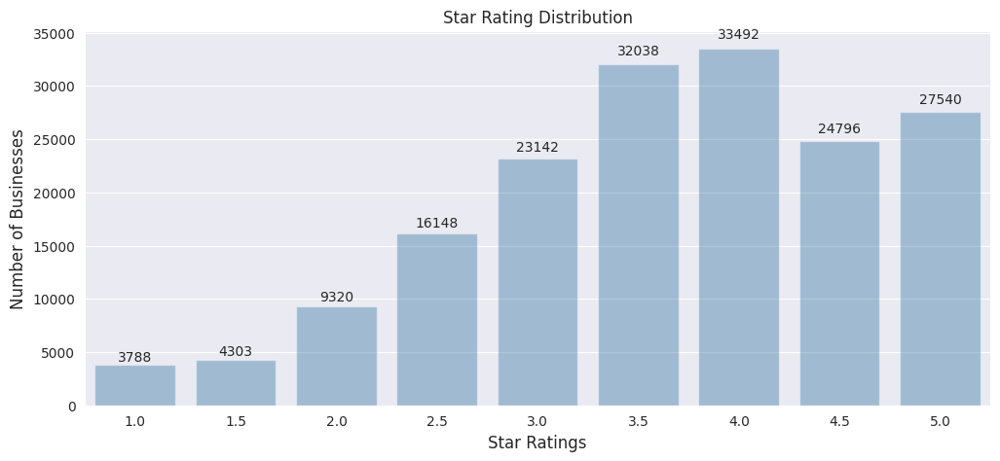

In [8]:
# Get the distribution of star ratings
data = business['stars'].value_counts()  # Count occurrences of each star rating
data = data.sort_index()  # Sort by star rating

# Plot the bar chart
plt.figure(figsize=(12, 5))  # Set the figure size
ax = sns.barplot(x=data.index, y=data.values, alpha=0.4)  # Draw a barplot using seaborn
plt.title("Star Rating Distribution")  # Set the plot title
plt.ylabel('Number of Businesses', fontsize=12)  # Label for y-axis
plt.xlabel('Star Ratings', fontsize=12)  # Label for x-axis

# Add text labels above each bar
rects = ax.patches  # Get the bar rectangles
labels = data.values  # Get the counts
for rect, label in zip(rects, labels):  # Loop through bars and their corresponding labels
    height = rect.get_height()  # Get the height of each bar
    ax.text(rect.get_x() + rect.get_width()/2, height*1.02, label, ha='center', va='bottom')  # Add text above each bar

plt.show()  # Display the plot

The following code uses the barplot() function from the Seaborn library to create a bar chart that shows the distribution of popular business categories on Yelp and their counts.

In [9]:
business['categories']

,categories
0,Dentists;General Dentistry;Health & Medical;Or...
1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,Departments of Motor Vehicles;Public Services ...
3,Sporting Goods;Shopping
4,American (New);Nightlife;Bars;Sandwiches;Ameri...
...,...
174562,Car Dealers;Automotive
174563,Body Shops;Automotive
174564,Home Services;Property Management;Real Estate
174565,Spray Tanning;Tanning;Beauty & Spas


In [10]:
test = 'Dentists;General Dentistry;Health'
test.split(';')

['Dentists', 'General Dentistry', 'Health']

In [11]:
business['categories'].str.split(';').explode().reset_index(drop=True).value_counts()[:10]

,count
categories,
Restaurants,54618
Shopping,27971
Food,24777
Beauty & Spas,17014
Home Services,16205
Health & Medical,14230
Nightlife,12154
Local Services,11232
Automotive,11052


There are 59106 unique business types/categories on Yelp!


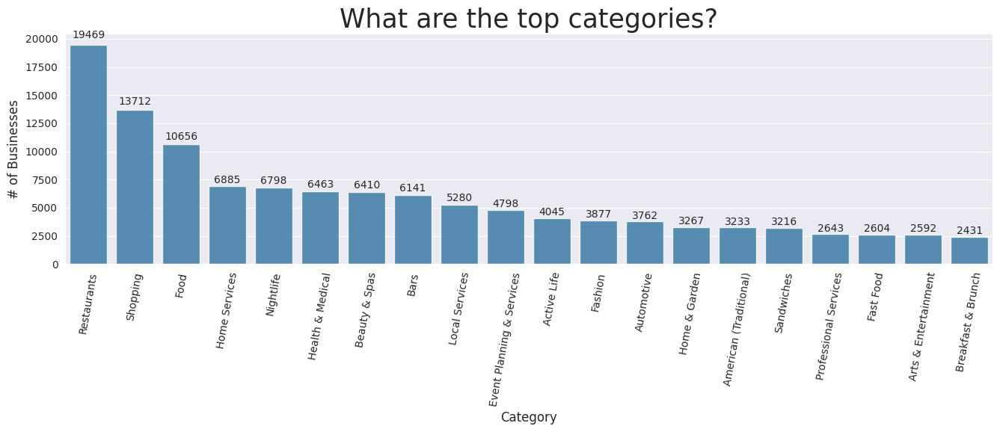

In [12]:
# Get all business categories as a single string
business_cats = ' '.join(business['categories'])  # Join all category strings from the 'categories' column

# Split categories into individual entries and store in a DataFrame
cats = pd.DataFrame(business_cats.split(';'), columns=['category'])  # Split by semicolon and create a DataFrame
x = cats.category.value_counts()  # Count the frequency of each category
print("There are", len(x), "unique business types/categories on Yelp!")  # Print the total number of unique categories

# Prepare data for bar plot
x = x.sort_values(ascending=False)  # Sort by frequency in descending order
x = x.iloc[0:20]  # Take the top 20 categories for plotting

# Plot the bar chart
plt.figure(figsize=(16, 4))  # Set figure size
ax = sns.barplot(x=x.index, y=x.values, alpha=0.8)  # Plot bar chart using Seaborn
plt.title("What are the top categories?", fontsize=25)  # Set chart title
locs, labels = plt.xticks()  # Get x-axis labels
plt.setp(labels, rotation=80)  # Rotate x-axis labels for better readability
plt.ylabel('# of Businesses', fontsize=12)  # Label for y-axis
plt.xlabel('Category', fontsize=12)  # Label for x-axis

# Add text labels above each bar
rects = ax.patches  # Get the bar rectangles
labels = x.values  # Get the count values
for rect, label in zip(rects, labels):  # Loop through bars and their labels
    height = rect.get_height()  # Get height of each bar
    ax.text(rect.get_x() + rect.get_width()/2, height*1.02, label, ha='center', va='bottom')  # Add text above each bar

plt.show()  # Display the plot


Relationships with rating

In [13]:
reviews

,review_id,user_id,business_id,stars,date,text,useful,funny,cool
0,vkVSCC7xljjrAI4UGfnKEQ,bv2nCi5Qv5vroFiqKGopiw,AEx2SYEUJmTxVVB18LlCwA,5,2016-05-28,Super simple place but amazing nonetheless. It...,0,0,0
1,n6QzIUObkYshz4dz2QRJTw,bv2nCi5Qv5vroFiqKGopiw,VR6GpWIda3SfvPC-lg9H3w,5,2016-05-28,Small unassuming place that changes their menu...,0,0,0
2,MV3CcKScW05u5LVfF6ok0g,bv2nCi5Qv5vroFiqKGopiw,CKC0-MOWMqoeWf6s-szl8g,5,2016-05-28,Lester's is located in a beautiful neighborhoo...,0,0,0
3,IXvOzsEMYtiJI0CARmj77Q,bv2nCi5Qv5vroFiqKGopiw,ACFtxLv8pGrrxMm6EgjreA,4,2016-05-28,Love coming here. Yes the place always needs t...,0,0,0
4,L_9BTb55X0GDtThi6GlZ6w,bv2nCi5Qv5vroFiqKGopiw,s2I_Ni76bjJNK9yG60iD-Q,4,2016-05-28,Had their chocolate almond croissant and it wa...,0,0,0
...,...,...,...,...,...,...,...,...,...
5261663,PoGSiNz1X5SUu0qEt-qM5w,mPjPyipaD0C_myqWqDipZg,Ngk84Ax1tXgpoJFEGxot3w,1,2011-11-21,"Bought groupon $39 for 4 months from groupon, ...",36,3,3
5261664,-CJNPrDWgIkorx4iEZJXIg,mPjPyipaD0C_myqWqDipZg,pOEL97ld-FJMKO8Ki8JmYg,3,2016-04-30,"Spring rolls was pretty good, cod was a bit ra...",0,0,0
5261665,W9eVvOcpBvG6lpJPoJOxuA,mPjPyipaD0C_myqWqDipZg,5ubokMNw8qfbX2WtxgJG1Q,4,2011-10-23,"Had a 8 dish set meal, was enough for 10 peopl...",3,0,1
5261666,hqQ1UTFKMN2P1ezUow48OQ,mPjPyipaD0C_myqWqDipZg,EO3i5kTUG7_S2OIQ23sdSA,3,2011-11-07,"A small, cozy family run Authentic korean rest...",2,0,0


In [14]:
reviews['length'] = reviews['text'].apply(len)

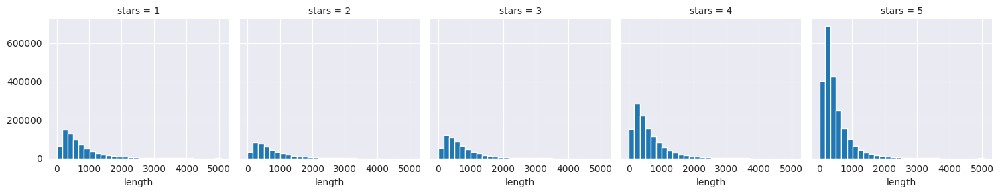

In [29]:
graph = sns.FacetGrid(data=reviews,col='stars')
graph.map(plt.hist,'length',bins=30)

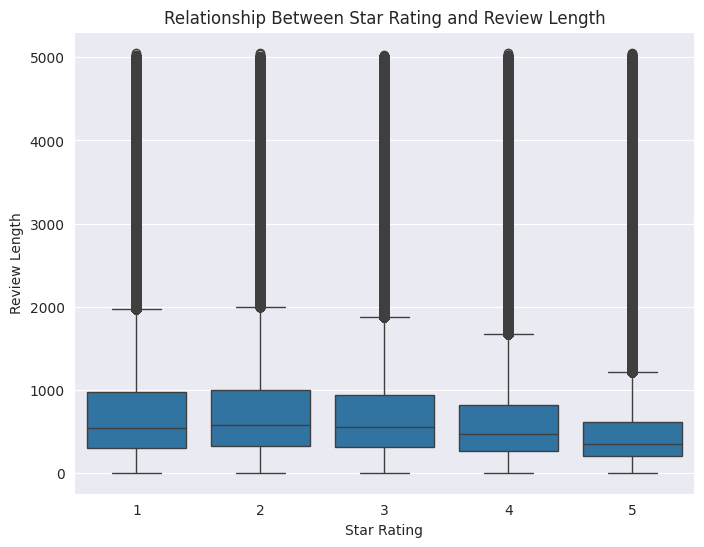

In [30]:
# Boxplot showing the distribution of review lengths across different star ratings
plt.figure(figsize=(8, 6))
sns.boxplot(x='stars', y='length', data=reviews)
plt.title('Relationship Between Star Rating and Review Length')  # Set plot title
plt.xlabel('Star Rating')  # Label for x-axis
plt.ylabel('Review Length')  # Label for y-axis
plt.show()

People tend to write longer reviews when they're unhappy, likely to explain issues or warn others. In contrast, positive reviews are usually short and to the point. This insight is valuable for understanding user sentiment intensity and can inform sentiment modeling or business response strategies.

### Why Are There More High-Star Reviews on Yelp?

The observation that high-star (4★ and 5★) reviews are more frequent is a common trend in user-generated content platforms like Yelp. This can be explained by several behavioral and structural factors:

---

#### ✅ 1. Satisfied Users Are More Willing to Leave Positive Reviews
Many users tend to write reviews when they are pleased with their experience. If the experience is good, they feel it's worth recommending, whereas unsatisfied users may simply leave silently.

- Positive experiences lead to a higher volume of short, positive reviews.
- Negative experiences, though often longer and more detailed, are less frequent overall.

---

#### ✅ 2. **Survivorship Bias**
Most businesses that remain visible and active on Yelp are those with reasonably good performance. Poorly rated businesses often:

- Receive fewer visitors over time,
- Eventually close or are delisted,
- Attract fewer reviews due to lack of interest.

As a result, the **active dataset skews toward well-rated businesses**, leading to more high-star reviews.

---

#### ✅ 3. **Rating Tendencies and Social Norms**
Many users default to giving 4★ or 5★ unless there is a strong reason not to. It's common for users to:

- Avoid giving low ratings unless severely dissatisfied,
- Consider 3★ a "neutral" or even "low" score, especially in the U.S.

---

#### ✅ 4. **Business Incentives and Review Requests**
Businesses often encourage happy customers to leave reviews:

- By requesting reviews at the end of service,
- Offering incentives like discounts or freebies (despite Yelp's policy discouraging this),
- Responding positively to 5-star reviews, reinforcing the behavior.

---

### 🔍 Summary
> The higher number of 4★ and 5★ reviews is a result of **user behavior, platform design, and business strategies**. It reflects not just service quality, but also the **psychology of feedback** and **data visibility** over time.


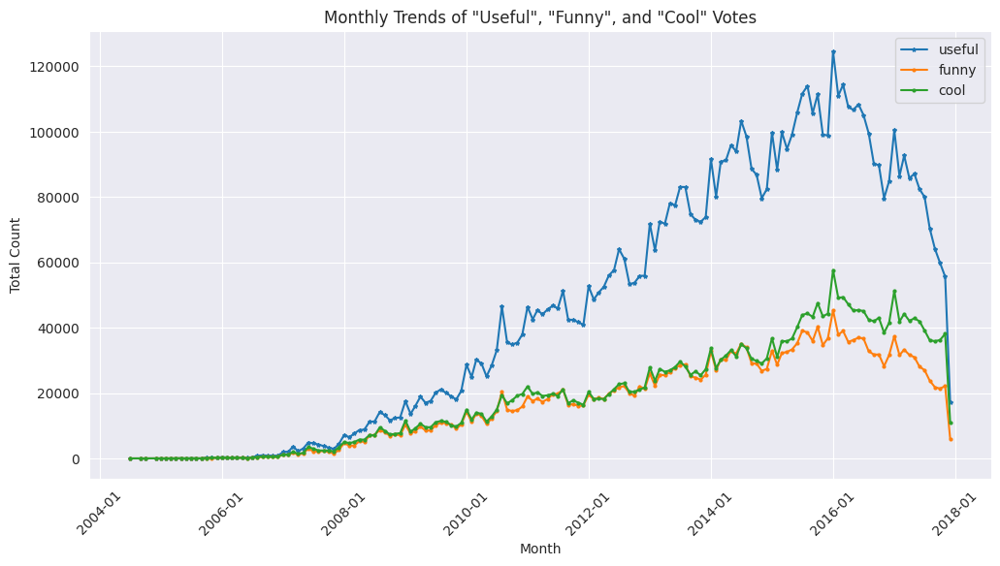

In [31]:
# How are the trends for different types of review votes?

from matplotlib.dates import DateFormatter

# Convert the review date to datetime format
reviews['datetime'] = pd.to_datetime(reviews['date'])

# Group by month and calculate the total sum of 'useful', 'funny', and 'cool' votes
monthly_summary = reviews.groupby(reviews['datetime'].dt.to_period('M')).agg({
    'useful':'sum',
    'funny':'sum',
    'cool':'sum'
}).reset_index()

# Convert Period type back to Timestamp for plotting
monthly_summary['datetime'] = monthly_summary['datetime'].dt.to_timestamp()

# Plot the line chart
plt.figure(figsize=(12, 6))
plt.plot(monthly_summary['datetime'], monthly_summary['useful'], label='useful', marker='*', markersize=3)
plt.plot(monthly_summary['datetime'], monthly_summary['funny'], label='funny', marker='o', markersize=2)
plt.plot(monthly_summary['datetime'], monthly_summary['cool'], label='cool', marker='o', markersize=2)

# Set x-axis date format
date_form = DateFormatter("%Y-%m")
plt.gca().xaxis.set_major_formatter(date_form)
plt.xticks(rotation=45)

# Add title and axis labels
plt.title('Monthly Trends of "Useful", "Funny", and "Cool" Votes')
plt.xlabel('Month')
plt.ylabel('Total Count')
plt.legend()

# Display the plot
plt.show()

## Map Visualization

### Review Location Analysis

In this section, we analyze the **geographic locations** of businesses on Yelp.

1. First, we examine the **global distribution** of Yelp businesses.
2. Then, we zoom in on the **two most concentrated regions**: **North America** and **Europe**.
3. We explore the **cities with the highest number of reviews**.
4. Finally, we visualize the **top two cities** ranked by review count.

### Global View


In this code block, we use **Matplotlib** and the **Basemap** toolkit to create a basic world map.

- First, we import the necessary libraries.
- Then, we create a figure with a specified size.
- We use **orthographic projection** to generate a globe-style view of the world.
- Continents and oceans are filled with custom color codes to enhance visual clarity.
- Country borders are drawn to outline regions on the map.
- Using a scatter plot, we mark the **latitude and longitude** of businesses as red dots.
- Finally, a title is added to the map, and the visualization is displayed.

This global map helps us understand the **geographic distribution of Yelp businesses** around the world.

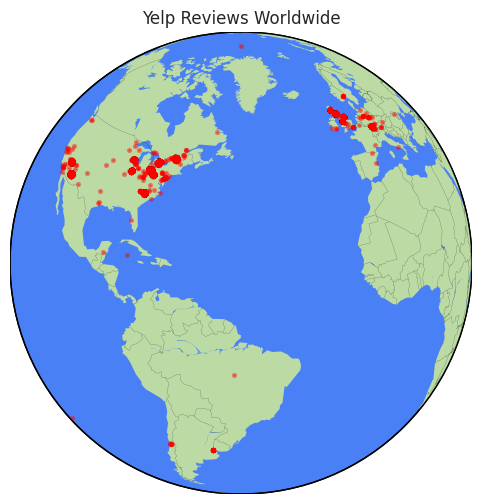

In [18]:
# Import necessary libraries
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

# Create a figure with specified size
plt.figure(1, figsize=(15, 6))

# Create a globe-style map using orthographic projection
m1 = Basemap(projection='ortho', lat_0=20, lon_0=-50)

# Fill continents and oceans with custom colors
m1.fillcontinents(color='#bbdaa4', lake_color='#4384f3')

# Draw the map boundary (ocean outline) with a custom fill color
m1.drawmapboundary(fill_color='#4a80f5')

# Draw country borders with custom line width and color
m1.drawcountries(linewidth=0.1, color="black")

# Plot business locations as red dots based on their longitude and latitude
mxy = m1(business["longitude"].tolist(), business["latitude"].tolist())
m1.scatter(mxy[0], mxy[1], s=3, c="red", lw=2, alpha=0.4, zorder=5)

# Add a title to the map
plt.title("Yelp Reviews Worldwide")

# Show the map
plt.show()


### North America and Europe Area

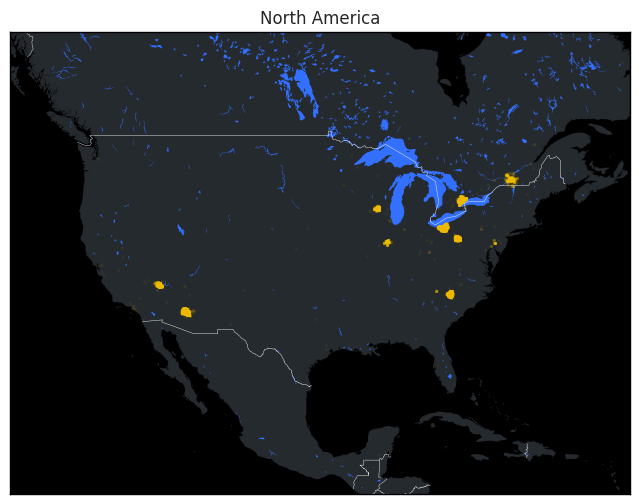

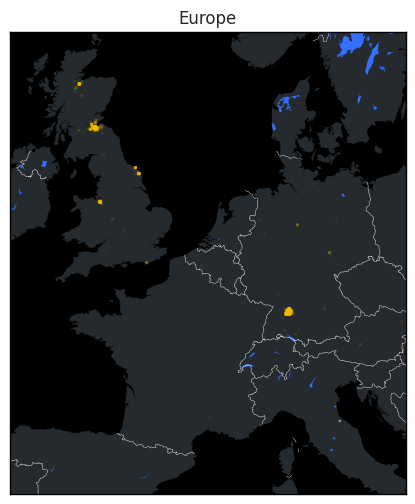

In [19]:
# Filter data to North America
lon_min, lon_max = -132.714844, -59.589844
lat_min, lat_max = 13.976715, 56.395664

# Create a mask for North America coordinates
idx_NA = (business["longitude"] > lon_min) & \
         (business["longitude"] < lon_max) & \
         (business["latitude"] > lat_min) & \
         (business["latitude"] < lat_max)

# Apply the mask to create a subset for North America
NA_business = business[idx_NA]

# Initialize the map plot
plt.figure(figsize=(12, 6))
m2 = Basemap(projection='merc',
             llcrnrlat=lat_min,
             urcrnrlat=lat_max,
             llcrnrlon=lon_min,
             urcrnrlon=lon_max,
             lat_ts=35,
             resolution='i')

# Fill land and water with custom colors
m2.fillcontinents(color='#252a2f', lake_color='#3370ff')  # Dark gray for land, blue for lakes
m2.drawmapboundary(fill_color='#000000')  # Black background for ocean
m2.drawcountries(linewidth=0.3, color="w")  # Country borders in white

# Plot business locations in North America
mxy = m2(NA_business["longitude"].tolist(), NA_business["latitude"].tolist())
m2.scatter(mxy[0], mxy[1], s=5, c="#ffcc00", lw=0, alpha=0.05, zorder=5)  # Yellow points with transparency

plt.title("North America")

# Filter data to Europe
lon_min, lon_max = -8.613281, 16.699219
lat_min, lat_max = 40.488737, 59.204064

# Create a mask for Europe coordinates
idx_euro = (business["longitude"] > lon_min) & \
           (business["longitude"] < lon_max) & \
           (business["latitude"] > lat_min) & \
           (business["latitude"] < lat_max)

# Apply the mask to create a subset for Europe
euro_business = business[idx_euro]

# Initialize the map plot
plt.figure(figsize=(12, 6))
m3 = Basemap(projection='merc',
             llcrnrlat=lat_min,
             urcrnrlat=lat_max,
             llcrnrlon=lon_min,
             urcrnrlon=lon_max,
             lat_ts=35,
             resolution='i')

# Fill land and water with custom colors
m3.fillcontinents(color='#252a2f', lake_color='#3370ff')
m3.drawmapboundary(fill_color='#000000')
m3.drawcountries(linewidth=0.3, color="w")

# Plot business locations in Europe
mxy = m3(euro_business["longitude"].tolist(), euro_business["latitude"].tolist())
m3.scatter(mxy[0], mxy[1], s=5, c="#ffcc00", lw=0, alpha=0.05, zorder=5)

plt.title("Europe")
plt.show()

### City View: Las Vegas, Phoenix, Stuttgart, Edinburgh

Next, we take a closer look at **four specific cities** by plotting their business locations based on latitude and longitude:

- **Las Vegas**
- **Phoenix**
- **Stuttgart**
- **Edinburgh**

These city-level maps help us understand the **spatial distribution of Yelp businesses** in different urban environments and how concentrated the reviews are within each city.


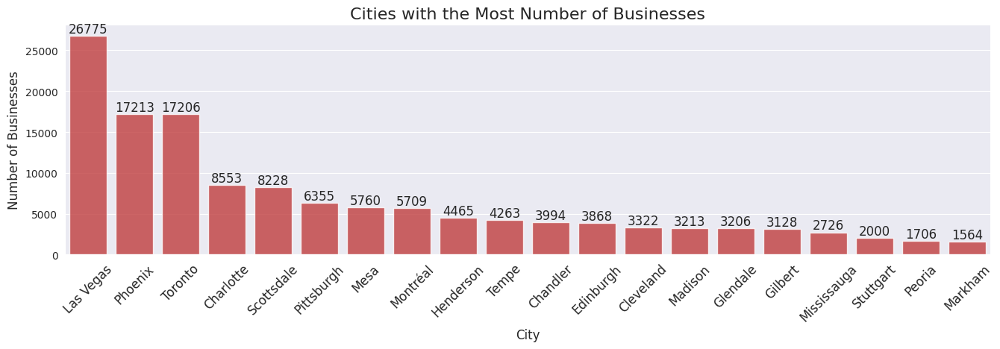

In [20]:
# Get the number of businesses per city
x = business['city'].value_counts()  # Count businesses by city
x = x.sort_values(ascending=False)   # Sort in descending order
x = x.iloc[0:20]                     # Select the top 20 cities

# Plot the bar chart
plt.figure(figsize=(16, 4))
ax = sns.barplot(x=x.index, y=x.values, alpha=0.8, color=color[3])  # Use a consistent color from the palette
plt.title("Cities with the Most Number of Businesses", fontsize=16)  # Set title
plt.xticks(rotation=45, fontsize=12)  # Rotate x-axis labels for readability
plt.ylabel('Number of Businesses', fontsize=12)
plt.xlabel('City', fontsize=12)

rects = ax.patches  # Get the bar rectangles
labels = x.values   # Get the business counts

# Add data labels on top of each bar
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label,
            ha='center', va='bottom', fontsize=12)

plt.show()


In [21]:
# Extract relevant columns for analysis
rating_data = business[['latitude', 'longitude', 'stars', 'review_count']]

# Create a custom column 'popularity' calculated as: stars × review_count
rating_data['popularity'] = rating_data['stars'] * rating_data['review_count']

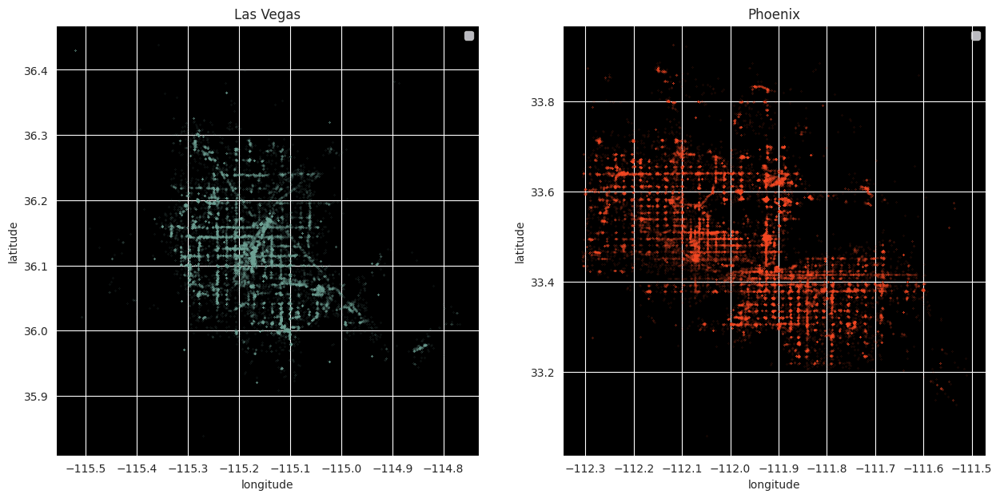

In [22]:
# Create a canvas with two subplots, setting the figure size to 15x7
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

# Random coordinates around Las Vegas
lat = 36.207430
lon = -115.268460

# Define bounding box for the Las Vegas area
lon_min, lon_max = lon - 0.3, lon + 0.5
lat_min, lat_max = lat - 0.4, lat + 0.5

# Filter the dataset for businesses in the Las Vegas area
ratings_data_vegas = rating_data[
    (rating_data["longitude"] > lon_min) &
    (rating_data["longitude"] < lon_max) &
    (rating_data["latitude"] > lat_min) &
    (rating_data["latitude"] < lat_max)
]

# Plot scatter plot for Las Vegas businesses
ratings_data_vegas.plot(kind='scatter', x='longitude', y='latitude',
                        color='#74a89b', s=0.02, alpha=0.6, subplots=True, ax=ax1)
ax1.set_title("Las Vegas")
ax1.set_facecolor('black')  # Set subplot background to black

# Random coordinates around Phoenix
lat = 33.435463
lon = -112.006989

# Define bounding box for the Phoenix area
lon_min, lon_max = lon - 0.3, lon + 0.5
lat_min, lat_max = lat - 0.4, lat + 0.5

# Filter the dataset for businesses in the Phoenix area
ratings_data_phoenix = rating_data[
    (rating_data["longitude"] > lon_min) &
    (rating_data["longitude"] < lon_max) &
    (rating_data["latitude"] > lat_min) &
    (rating_data["latitude"] < lat_max)
]

# Plot scatter plot for Phoenix businesses
ratings_data_phoenix.plot(kind='scatter', x='longitude', y='latitude',
                          color='#fb4e29', s=0.02, alpha=0.6, subplots=True, ax=ax2)
ax2.set_title("Phoenix")
ax2.set_facecolor('black')  # Set subplot background to black

# Display the plot
f.show()

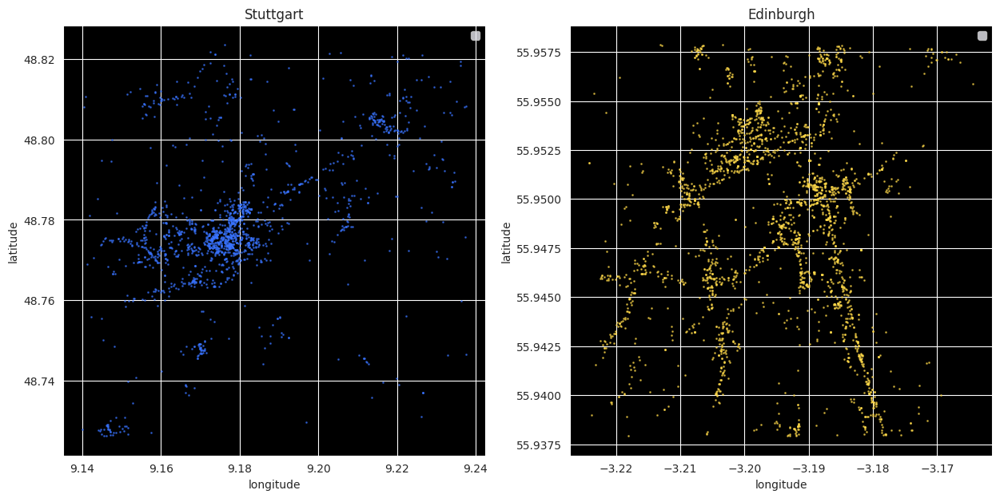

In [23]:
# Import necessary plotting library
import matplotlib.pyplot as plt

# Create a figure with two subplots, size 15x7
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

# Select a central point in Stuttgart
lat = 48.7757200
lon = 9.187950

# Adjust the bounding box to zoom into the Stuttgart area
lon_min, lon_max = lon - 0.05, lon + 0.05
lat_min, lat_max = lat - 0.05, lat + 0.05

# Filter businesses located within the bounding box
ratings_data_stuttgart = rating_data[
    (rating_data["longitude"] > lon_min) &
    (rating_data["longitude"] < lon_max) &
    (rating_data["latitude"] > lat_min) &
    (rating_data["latitude"] < lat_max)
]

# Plot a scatter map of businesses in Stuttgart
ratings_data_stuttgart.plot(kind='scatter', x='longitude', y='latitude',
                            color='#3973fe', s=1, alpha=0.6, subplots=True, ax=ax1)
ax1.set_title("Stuttgart")
ax1.set_facecolor('black')

# Select a central point in Edinburgh
lat = 55.947871
lon = -3.194255

# Adjust the bounding box to zoom into the Edinburgh area
lon_min, lon_max = lon - 0.03, lon + 0.03
lat_min, lat_max = lat - 0.01, lat + 0.01

# Filter businesses located within the bounding box
ratings_data_edinburgh = rating_data[
    (rating_data["longitude"] > lon_min) &
    (rating_data["longitude"] < lon_max) &
    (rating_data["latitude"] > lat_min) &
    (rating_data["latitude"] < lat_max)
]

# Plot a scatter map of businesses in Edinburgh
ratings_data_edinburgh.plot(kind='scatter', x='longitude', y='latitude',
                            color='#ffd949', s=1, alpha=0.6, subplots=True, ax=ax2)
ax2.set_title("Edinburgh")
ax2.set_facecolor('black')

# Display the plots
f.show()

#### Urban Structure and Spatial Insights

An interesting observation is that **U.S. cities often exhibit a grid-like street layout**, whereas cities in other parts of the world may have **more organic and irregular designs**.

By visualizing the geographic locations of businesses on a map, we can gain deeper insight into the **distribution of economic activity** and the **concentration of businesses** across different urban areas.

This method reveals spatial patterns and trends in a **clear and engaging way**, which is highly valuable for:
- **Urban planning**
- **Policy making**
- **Business strategy**

Data visualization allows us to explore and understand the **complex spatial relationships** within urban areas visually. It offers a powerful lens through which we can better comprehend **how cities evolve and function over time**.

### Ratings in Las Vegas

Let’s take a closer look at how people rate **different businesses in Las Vegas**.

Below is an **interactive animation** created using the powerful **Folium** package, which brings Yelp data to life through beautiful **Leaflet-based map visualizations**.

In this animation, businesses are highlighted based on their **star ratings**, allowing us to visually explore:

- Whether there are specific **hotspots** with highly rated restaurants or services,
- And how **ratings are spatially distributed** across the city.

Interestingly, it turns out that **both high-rated and low-rated businesses are fairly evenly distributed throughout Las Vegas**.  
There isn’t a single concentrated area for only good or bad businesses — quality is scattered, and location doesn’t always predict experience!


Creating Interactive Maps with `folium`

`folium` is a Python library used to create **interactive maps**. It is built on top of the **Leaflet.js** JavaScript library and provides a simple Python interface for mapping geospatial data.

With `folium`, you can easily add **markers**, **heatmaps**, **polygons**, **circles**, and more to your map. It also supports pop-ups, tooltips, and displaying data directly on the map.

---
Example: Creating a Simple Map

```python
import folium

# Create a folium map object centered on Las Vegas
m = folium.Map(location=[36.127430, -115.138460], zoom_start=11)  # Set initial center and zoom level

# Add a marker to the map
folium.Marker(
    location=[36.127430, -115.138460],
    popup='Las Vegas'  # Popup text when clicked
).add_to(m)

# Display the map
m


In [24]:
import folium
import folium.plugins as plugins

# Prepare the data for Folium by reformatting it as required
data = []
# Get a list of unique star ratings
stars_list = list(rating_data['stars'].unique())

# Iterate through each star rating and collect the corresponding latitude and longitude data
for star in stars_list:
    subset = ratings_data_vegas[ratings_data_vegas['stars'] == star]
    # Append the location list (latitude and longitude) for this star rating to the data list
    data.append(subset[['latitude', 'longitude']].values.tolist())

# Set initial map center and zoom level (centered around Las Vegas)
lat = 36.127430
lon = -115.138460
zoom_start = 11

print("Vegas Review Heatmap Animation")

# Create a basic Folium map
m = folium.Map(location=[lat, lon], tiles="OpenStreetMap", zoom_start=zoom_start)

# Create a time-based heatmap using the HeatMapWithTime plugin
hm = plugins.HeatMapWithTime(data,
                             max_opacity=0.3,
                             auto_play=True,
                             display_index=True,
                             radius=7)
hm.add_to(m)  # Add the heatmap layer to the map

m  # Display the map

Vegas Review Heatmap Animation


## Review Mining

Let’s take a look at the **top users** ranked by the number of reviews they’ve written.  
These users are the most active contributors on Yelp and can offer valuable insights into user behavior and engagement patterns.


In [27]:
user_agg=reviews.groupby('user_id').agg(
            {'review_id':['count'],
             'date':['min','max'],
             'useful':['sum'],
             'funny':['sum'],
             'cool':['sum'],
             'stars':['mean']})

In [28]:
user_agg=user_agg.sort_values([('review_id','count')],ascending=False)
print("          Top 10 Users in Yelp")
user_agg.head(10)

          Top 10 Users in Yelp


review_id        date             useful  funny   cool  \
                           count         min         max    sum    sum    sum   
user_id                                                                         
CxDOIDnH8gp9KXzpBHJYXw      3569  2009-11-09  2017-12-05  11345   5546   6695   
bLbSNkLggFnqwNNzzq-Ijw      2077  2012-05-20  2017-12-11  23572  12630  16303   
PKEzKWv_FktMm2mGPjwd0Q      1611  2008-12-12  2017-12-05  12078   4987   8183   
DK57YibC5ShBmqQl97CKog      1463  2006-02-12  2017-12-10  13175   6693  10795   
QJI9OSEn6ujRCtrX06vs1w      1322  2007-03-20  2016-05-01   8748   4104   6142   
d_TBs6J3twMy9GChqUEXkg      1184  2010-12-27  2017-11-23   2992   1341   1792   
ELcQDlf69kb-ihJfxZyL0A      1159  2011-04-10  2017-12-10   2155   1298   1029   
cMEtAiW60I5wE_vLfTxoJQ      1126  2009-06-12  2017-12-07   1943   1213   1509   
hWDybu_KvYLSdEFzGrniTw      1117  2009-03-08  2017-11-26   7234   4968   5762   
U4INQZOPSUaj8hMjLlZ3KA      1101  2008-05-13  2017-12-11   6116   2832   4187   

                           stars  
                            mean  
user_id                           
CxDOIDnH8gp9KXzpBHJYXw  3.201737  
bLbSNkLggFnqwNNzzq-Ijw  3.256139  
PKEzKWv_FktMm2mGPjwd0Q  3.664804  
DK57YibC5ShBmqQl97CKog  3.826384  
QJI9OSEn6ujRCtrX06vs1w  3.622542  
d_TBs6J3twMy9GChqUEXkg  3.463682  
ELcQDlf69kb-ihJfxZyL0A  2.993097  
cMEtAiW60I5wE_vLfTxoJQ  4.066607  
hWDybu_KvYLSdEFzGrniTw  3.640107  
U4INQZOPSUaj8hMjLlZ3KA  3.714805

### Tracking High-Value Users

Let’s track the top users from the review dataset.

To do this, we create a **map of all the locations** they have reviewed over time and use that data to generate an **animated heatmap**.

This allows us to visually explore how their review activity is spread across different places and how it evolves chronologically—offering valuable insights into **user behavior, travel patterns, or loyalty to specific regions**.

In [33]:
# Tracking a Top User:
# Filter reviews for a specific high-value user
top_user_reviews = reviews[reviews['user_id'] == 'CxDOIDnH8gp9KXzpBHJYXw']

# Get location info for the businesses this user reviewed
top_user_locs = pd.merge(top_user_reviews, business, on='business_id')

# Extract the list of unique review dates (as strings)
date_list = list(top_user_locs['date'].unique())

# Reformat the data for use with Folium's HeatMapWithTime
data = []
for date in date_list:
    subset = top_user_locs[top_user_locs['date'] == date]
    df = subset[['latitude', 'longitude', 'date']]
    data.append(subset[['latitude', 'longitude']].values.tolist())


In [36]:
# Initialize map centered around Ontario, Canada (lat: 43.860397, lon: -79.303184) with a zoom level of 9
lat = 43.860397
lon = -79.303184
zoom_start = 9
print("                     Stalking the Top User    ")

# Create the base map using the CartoDB Positron tile style
m = folium.Map(location=[lat, lon], tiles="Cartodb Positron", zoom_start=zoom_start)

# Create a time-enabled heatmap using the preprocessed 'data' (user's review locations over time)
hm = plugins.HeatMapWithTime(data, max_opacity=0.3, auto_play=True, display_index=True)

# Add the heatmap to the map
hm.add_to(m)

# Display the interactive map
m

                     Stalking the Top User    


### Highest Rating with Increasing Useful

This regression plot shows the trend of **highest star ratings** in relation to the number of **"useful" votes** a review receives.

- The **x-axis** represents the threshold of "useful" votes, ranging from **100 to 1000**, in increments of 20.
- The **y-axis** shows the **maximum star rating** corresponding to each threshold.

This chart helps us understand the relationship between the **perceived usefulness of a review** and its **rating score**. It can reveal whether highly useful reviews are associated with higher (or lower) star ratings over time or across thresholds.

In [38]:
reviews[(reviews['useful']>0) & (reviews['funny']>0) & (reviews['cool']>0)]

,review_id,user_id,business_id,stars,date,text,useful,funny,cool,length,datetime
13,lsoSqIrrDbQvWpMvsSj2xw,u0LXt3Uea_GidxRW1xcsfg,RtUvSWO_UZ8V3Wpj0n077w,3,2012-12-03,Wanted to check out this place due to all the ...,2,1,1,597,2012-12-03
19,WYDFJOBOl7cycd7gN-c_xA,u0LXt3Uea_GidxRW1xcsfg,zgQHtqX0gqMw1nlBZl2VnQ,1,2012-10-30,really excited to hear of this restaurant comi...,9,2,1,1040,2012-10-30
25,Ia-w-nR1FrlzsiuEiqqlbg,u0LXt3Uea_GidxRW1xcsfg,Eox_Qq74oaFZ-YjthpHhBw,3,2011-07-18,Service is really slow here. I waited for over...,1,1,1,236,2011-07-18
27,_ku1sDwkmQo2wIgWAaluZw,u0LXt3Uea_GidxRW1xcsfg,tOhRQqiupLyJdBJVQMGOEQ,5,2012-09-23,OMG - Definitely worth going if you are in Mon...,1,1,1,145,2012-09-23
44,Q0j8DFqW_zWNa-H1QuuPgg,u0LXt3Uea_GidxRW1xcsfg,TrOgTZ0DfmQxvpTehiNibQ,1,2011-05-10,worse customer service ever. \nManager on duty...,11,5,5,217,2011-05-10
...,...,...,...,...,...,...,...,...,...,...,...
5261637,_HubomG7kARyUVuemJbZbQ,vPCYOCTMTixFXn1_60UjJQ,LBAkHJJfCoDj9aa5sc0Mxw,1,2013-12-13,For anyone that is actually from Illinois to d...,2,1,1,920,2013-12-13
5261639,K1fnP4pi9qXl2pw6G4gITQ,CPIGdVV2ByLA_nqP1F4S-Q,UicG-oyX4bjmcQbmXn7hGw,5,2012-12-29,I go there with my friends in a group to race ...,1,1,1,289,2012-12-29
5261645,CIMhrYaTrldYxWqYlYPN-A,mPjPyipaD0C_myqWqDipZg,6y-z_jGX7PCUubMPFDbxVA,4,2011-10-18,Went there on a tuesday nite in a group of 13 ...,1,2,2,708,2011-10-18
5261661,ZU2UF0YBkhQFctXH5Mry3A,mPjPyipaD0C_myqWqDipZg,CMkayuNDHPcd1dxO32kJyA,1,2012-05-24,This place is retarded!!! Called on a thursda...,4,4,1,431,2012-05-24


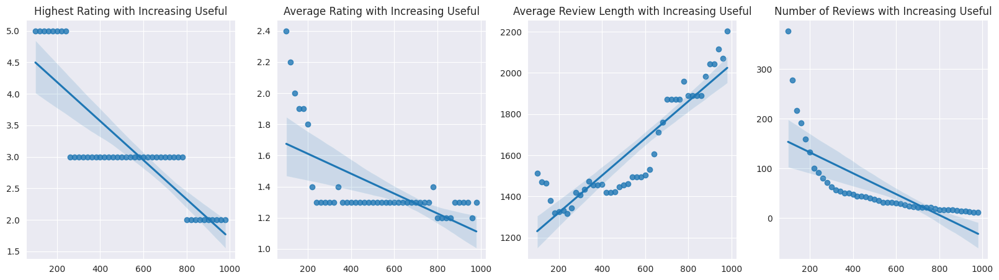

In [39]:
# Filter reviews that have at least one 'useful', 'funny', and 'cool' vote
reviews = reviews.query('useful > 0 and funny > 0 and cool > 0')

# Define thresholds for 'useful' votes (from 100 to 1000, step 20)
thresholds = [x for x in range(100, 1000, 20)]

# For each threshold, compute the following:
max_star = [round(reviews.query('useful > @thres').stars.max(), 1) for thres in thresholds]
avg_star = [round(reviews.query('useful > @thres').stars.mean(), 1) for thres in thresholds]
avg_review_len = [reviews.query('useful > @thres')['text'].agg(lambda x: len(x)).agg('mean') for thres in thresholds]
n_review = [reviews.query('useful > @thres').stars.count() for thres in thresholds]

# Create 4 regression plots
fig, axes = plt.subplots(1, 4, figsize=[20, 5])

sns.regplot(x=thresholds, y=max_star, ax=axes[0])
axes[0].title.set_text('Highest Rating with Increasing Useful')

sns.regplot(x=thresholds, y=avg_star, ax=axes[1])
axes[1].title.set_text('Average Rating with Increasing Useful')

sns.regplot(x=thresholds, y=avg_review_len, ax=axes[2])
axes[2].title.set_text('Average Review Length with Increasing Useful')

sns.regplot(x=thresholds, y=n_review, ax=axes[3])
axes[3].title.set_text('Number of Reviews with Increasing Useful')


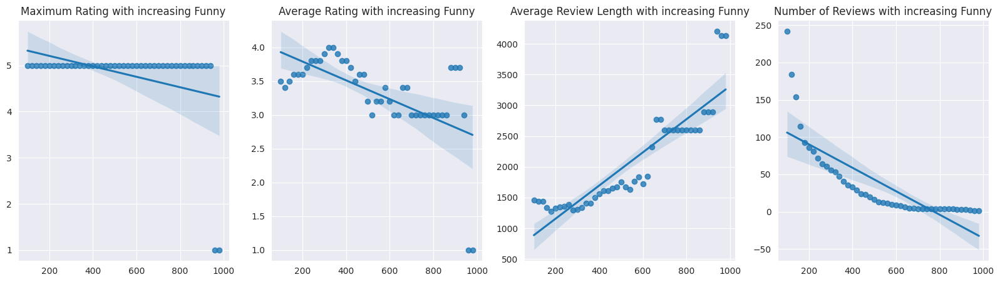

In [40]:
thresholds = [x for x in range(100,1000,20)]
max_star = [round(reviews.query('funny>@thres').stars.max(),1) for thres in thresholds]
avg_star = [round(reviews.query('funny>@thres').stars.mean(),1) for thres in thresholds]
avg_review_len = [reviews.query('funny>@thres')['text'].agg(lambda x: len(x)).agg('mean') for thres in thresholds]
n_review = [reviews.query('funny>@thres').stars.count() for thres in thresholds]

fig, axes = plt.subplots(1, 4, figsize = [20,5])
sns.regplot(x=thresholds, y=max_star,ax = axes[0])
axes[0].title.set_text('Maximum Rating with increasing Funny')

sns.regplot(x=thresholds, y=avg_star,ax = axes[1])
axes[1].title.set_text('Average Rating with increasing Funny')

sns.regplot(x=thresholds, y=avg_review_len,ax = axes[2])
axes[2].title.set_text('Average Review Length with increasing Funny')

sns.regplot(x=thresholds, y=n_review,ax = axes[3])
axes[3].title.set_text('Number of Reviews with increasing Funny')

### Sentiment Analysis

In [41]:
from textblob import TextBlob

Basic Text Processing and Sentiment Analysis with TextBlob

Below is a simple example using **TextBlob** to perform basic text processing and sentiment analysis:

```python
from textblob import TextBlob

# Create a TextBlob object
text = "I love this product! It's amazing."
blob = TextBlob(text)

# Tokenization
words = blob.words
print("Tokenized Words:", words)

# Part-of-Speech Tagging
tags = blob.tags
print("POS Tags:", tags)

# Noun Phrase Extraction
noun_phrases = blob.noun_phrases
print("Noun Phrases:", noun_phrases)

# Sentiment Analysis
sentiment = blob.sentiment
polarity = sentiment.polarity
subjectivity = sentiment.subjectivity
print("Sentiment Analysis:")
print("Polarity (from -1 to 1, negative to positive):", polarity)
print("Subjectivity (from 0 to 1, objective to subjective):", subjectivity)
```
This code first imports the **TextBlob** library and creates a `TextBlob` object named `blob`, which represents the text to be processed.

Then, by calling methods on the `TextBlob` object—such as `words`, `tags`, `noun_phrases`, and `sentiment`—it performs various natural language processing tasks including tokenization, part-of-speech tagging, noun phrase extraction, and sentiment analysis.

In this example, the input text is:

> `"I love this product! It's amazing."`

The `TextBlob` object executes the following tasks:
- **Tokenization**: Splits the text into individual words.
- **POS Tagging**: Identifies the grammatical role of each word.
- **Noun Phrase Extraction**: Extracts key noun phrases from the sentence.
- **Sentiment Analysis**: Measures the **polarity** (from -1 to 1, indicating negative to positive sentiment) and **subjectivity** (from 0 to 1, indicating objective to subjective content).

The results are printed to help understand the structure and emotional tone of the sentence.


In [43]:
%%time
elite_review_sentiment_score_2012 = reviews.merge(user[user['elite'].isnull()]['user_id'])\
.query("date.str.startswith('2016')", engine='python')['text'].apply(lambda x: TextBlob(x).sentiment.polarity)

regular_review_sentiment_score_2012 = reviews.merge(user[user['elite'].notnull()]['user_id'])\
.query("date.str.startswith('2016')", engine='python')['text'].apply(lambda x: TextBlob(x).sentiment.polarity)

CPU times: user 1min 45s, sys: 387 ms, total: 1min 46s
Wall time: 1min 48s


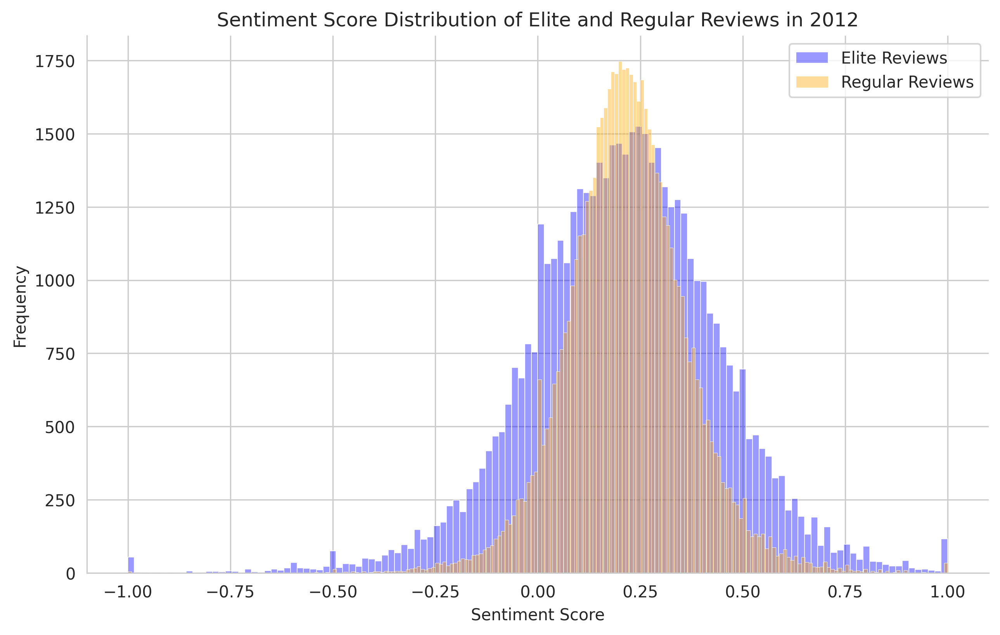

In [44]:
# Set image resolution
plt.rcParams['figure.dpi'] = 300

# Set Seaborn style
sns.set_style("whitegrid")

# Create the figure
plt.figure(figsize=(10, 6))

# Plot the sentiment score distribution for elite reviews
sns.histplot(elite_review_sentiment_score_2012, alpha=0.4, color='blue', label='Elite Reviews')

# Plot the sentiment score distribution for regular reviews
sns.histplot(regular_review_sentiment_score_2012, alpha=0.4, color='orange', label='Regular Reviews')

# Add title
plt.title('Sentiment Score Distribution of Elite and Regular Reviews in 2012')

# Label the x-axis
plt.xlabel('Sentiment Score')

# Label the y-axis
plt.ylabel('Frequency')

# Show legend
plt.legend()

# Remove top and right border lines
sns.despine()

# Display the plot
plt.show()

In [45]:
def senti_word_cloud(s, max_words=200):
    import matplotlib
    from wordcloud import WordCloud
    import matplotlib.pyplot as plt
    from textblob import TextBlob

    # Set default figure size
    matplotlib.rcParams['figure.figsize'] = (20, 10)

    # Create WordCloud objects for negative and positive texts
    wc1 = WordCloud(
        background_color="black",
        max_words=max_words,
        width=1920, height=1080
    )
    wc2 = WordCloud(
        background_color="white",
        max_words=max_words,
        width=1920, height=1080
    )

    # Lists to store positive and negative texts
    positivelist = []
    negativelist = []

    # Analyze sentiment of each sentence using TextBlob
    for each in s:
        each_word = TextBlob(each)
        feeling = each_word.sentiment.polarity
        if feeling > 0.5:
            positivelist.append(each)
        elif feeling < -0.5:
            negativelist.append(each)

    # Combine texts into a single string separated by spaces
    positive_string = " ".join(positivelist)
    negative_string = " ".join(negativelist)

    # Generate and plot word clouds
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    wc1.generate(negative_string)
    axes[0].imshow(wc1, interpolation='bilinear')
    axes[0].set_title('Negative')
    axes[0].axis('off')

    wc2.generate(positive_string)
    axes[1].imshow(wc2, interpolation='bilinear')
    axes[1].set_title('Positive')
    axes[1].axis('off')

    plt.show()


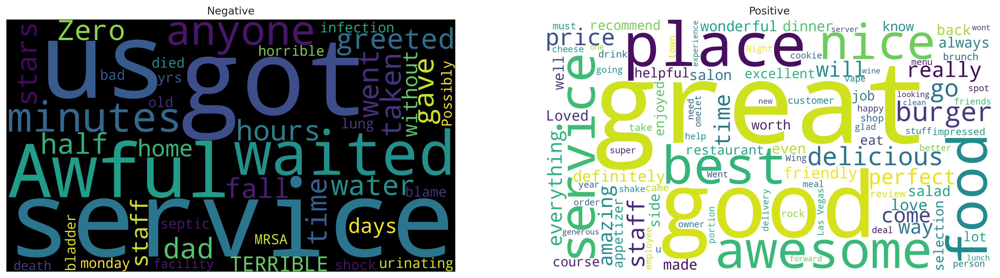

In [46]:
senti_word_cloud(reviews['text'].sample(1000),max_words = 100)

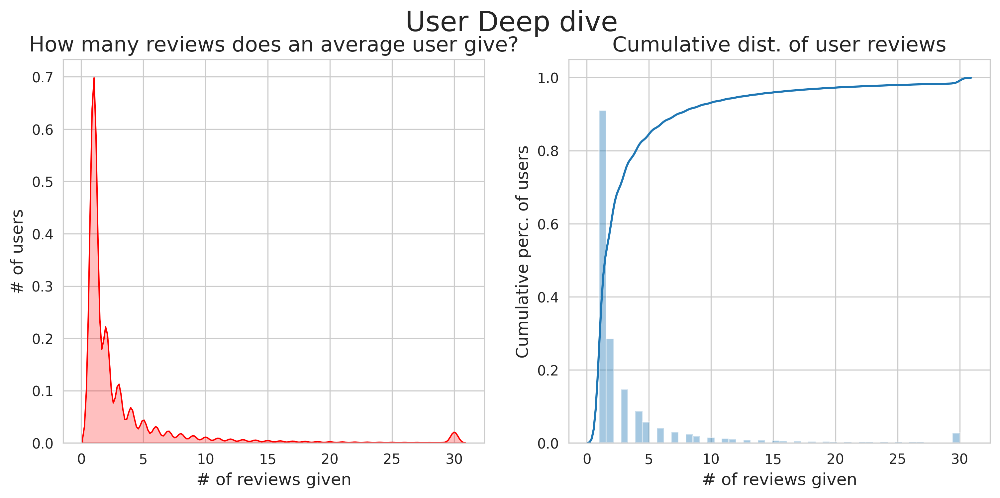

Took 4159.5361659526825 s


In [47]:
# Cap max reviews to 30 for better visuals
user_agg[('review_id','count')].loc[user_agg[('review_id','count')]>30] = 30
plt.figure(figsize=(12,5))
plt.suptitle("User Deep dive",fontsize=20)
gridspec.GridSpec(1,2)
plt.subplot2grid((1,2),(0,0))
#Cumulative Distribution
ax=sns.kdeplot(user_agg[('review_id','count')],shade=True,color='r')
plt.title("How many reviews does an average user give?",fontsize=15)
plt.xlabel('# of reviews given', fontsize=12)
plt.ylabel('# of users', fontsize=12)

#Cumulative Distribution
plt.subplot2grid((1,2),(0,1))
sns.distplot(user_agg[('review_id','count')],
             kde_kws=dict(cumulative=True))
plt.title("Cumulative dist. of user reviews",fontsize=15)
plt.ylabel('Cumulative perc. of users', fontsize=12)
plt.xlabel('# of reviews given', fontsize=12)

plt.show()
end_time=time.time()
print("Took",end_time-start_time,"s")

## Checkin Data

`highlight_max` Function

The `highlight_max` function is a custom Python function used to **highlight the maximum value(s)** in a Pandas `Series` or `DataFrame`.

---

Parameters

- `data`: A Pandas `Series` or `DataFrame` on which to apply the highlight.
- `color`: *(optional)* A string specifying the color to use for highlighting. Default is `'yellow'`.

---

How It Works

1. The function first defines a CSS style string `attr` using the given `color` (e.g., `"background-color: yellow"`).

2. It then checks the **dimension** of `data` using `data.ndim`:
   - If `data` is a **Series** (`ndim == 1`), it compares each value to the max using `data == data.max()`, creating a Boolean mask `is_max`. A list comprehension is then used to return a list of CSS strings:
     - `'attr'` for the max value,
     - `''` (empty string) otherwise.

3. If `data` is a **DataFrame** (`ndim > 1`), the function finds the **maximum value across the entire DataFrame** using `data.max().max()` and creates a Boolean `DataFrame` called `is_max` where each entry is `True` if it matches the max.

4. Using `np.where()`, it builds a new `DataFrame` of CSS style strings:
   - `'attr'` for max values,
   - `''` for all others.

5. The result is a style map that can be applied using Pandas' `.style.apply()` functionality for **styling DataFrames in notebooks**.

In [48]:
def highlight_max(data, color='yellow'):
    '''
    highlight the maximum in a Series or DataFrame
    '''
    attr = 'background-color: {}'.format(color)
    if data.ndim == 1:  # Series from .apply(axis=0) or axis=1
        is_max = data == data.max()
        return [attr if v else '' for v in is_max]
    else:  # from .apply(axis=None)
        is_max = data == data.max().max()
        return pd.DataFrame(np.where(is_max, attr, ''),
                            index=data.index, columns=data.columns)

In [49]:
# Group the check-in data by 'weekday' and 'hour', and sum the check-ins
df = check_in.groupby(['weekday', 'hour'])['checkins'].sum()

# Reset index to convert grouped results into a DataFrame
df = df.reset_index()

# Pivot the table: 'hour' as rows, 'weekday' as columns, 'checkins' as values
df = df.pivot(index='hour', columns='weekday')[['checkins']]

# Drop extra column level
df.columns = df.columns.droplevel()

# Reset index again for clean structure
df = df.reset_index()

# Convert 'hour' column to integers (remove minutes if present)
df.hour = df.hour.apply(lambda x: str(x).split(':')[0])  # Keep only the hour
df.hour = df.hour.astype(int)

# Sort the DataFrame by hour
df = df.sort_values('hour')

# Reorder columns to place 'hour' first
df = df[['hour', 'Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']]

# Create a color map
cm = sns.light_palette("orange", as_cmap=True)

# Highlight the max value in each column using a custom highlight function
df.style.apply(highlight_max, color='#679bff', axis=0)

weekday,hour,Mon,Tue,Wed,Thu,Fri,Sat,Sun
0,0,163336,156195,166254,171669,178666,224425,225209
11,1,161168,162632,174696,181712,190371,245453,235295
16,2,140252,141732,153923,160906,169989,236195,224716
17,3,106422,103584,111840,117639,127783,189242,184979
18,4,73497,68950,72821,76283,86825,138952,140092
19,5,48253,42977,44109,42130,55672,97062,101133
20,6,31624,26646,27175,27108,36546,68465,72404
21,7,23022,18946,19195,20672,26551,49633,52890
22,8,15327,12452,12484,13830,18004,33591,35079
23,9,11000,8837,8814,10058,12683,21969,21524


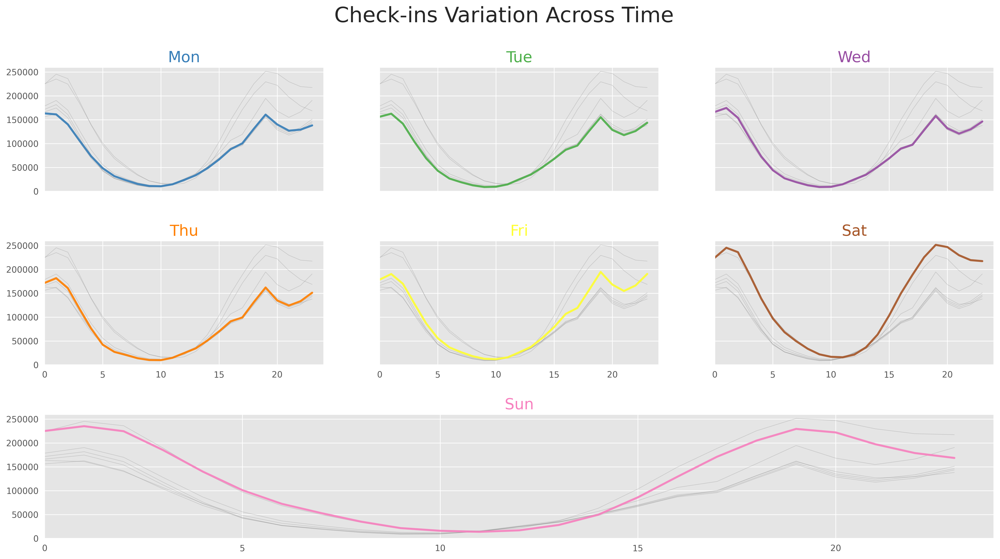

In [50]:
# Set the plotting style
plt.style.use('ggplot')  # Use ggplot-style for cleaner visuals

# Create a color palette
palette = plt.get_cmap('Set1')

# Create the main figure
plt.figure(figsize=(20, 10))

# Add a main title for the figure
plt.suptitle("Check-ins Variation Across Time", fontsize=25)

# Set up a 3x3 grid layout for subplots
gridspec.GridSpec(3, 3)

# Adjust vertical spacing between subplots
plt.subplots_adjust(hspace=0.4)

# Start subplot counter
num = 0

# Loop through each weekday column to generate a line plot
for column in df.drop('hour', axis=1):
    num += 1

    # Special handling for Sunday: span full width at the bottom
    if num == 7:
        plt.subplot2grid((3, 3), (2, 0), colspan=3)
    else:
        plt.subplot(3, 3, num)

    # Plot all lines in light gray for reference (context)
    for v in df.drop('hour', axis=1):
        plt.plot(df['hour'], df[v], marker='', color='grey', linewidth=0.6, alpha=0.3)

    # Plot the main line for the current day
    plt.plot(df['hour'], df[column], marker='', color=palette(num), linewidth=2.4, alpha=0.9, label=column)

    # Set x and y axis limits
    plt.xlim(0, 24)
    plt.ylim(-2, 260000)

    # Remove x-axis labels for top rows
    if num in range(4):
        plt.tick_params(labelbottom=False)

    # Remove y-axis labels for non-leftmost subplots
    if num not in [1, 4, 7]:
        plt.tick_params(labelleft=False)

    # Set the title for each subplot
    plt.title(column, loc='center', fontsize=18, fontweight=0, color=palette(num))

## Business-Level Analysis

### Business with most Five Star Reviews from Users

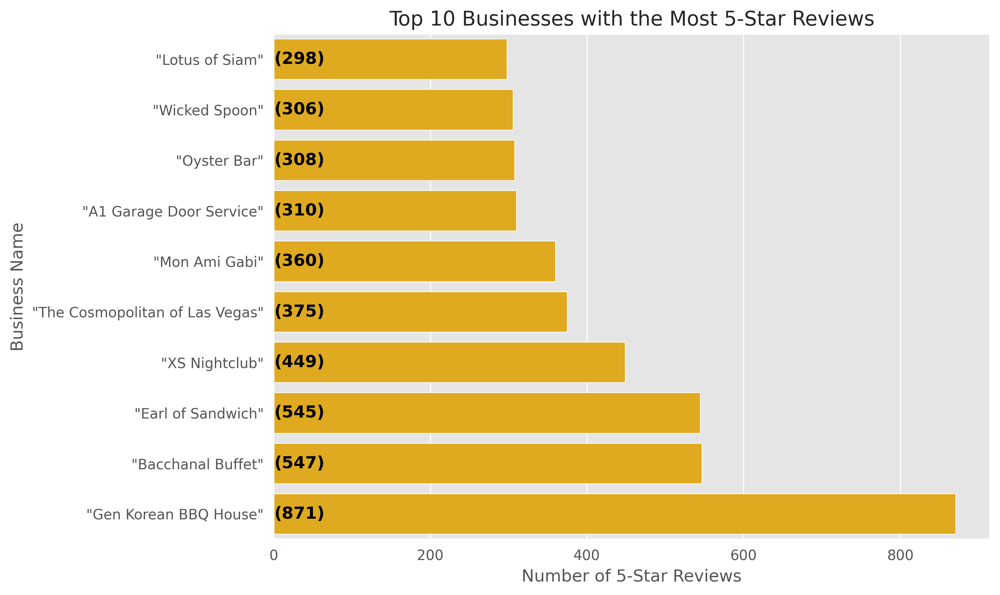

In [53]:
# Step 1: Filter for 5-star reviews, group by business_id, and count occurrences
most5StarsReviews = reviews[reviews['stars'] == 5].groupby('business_id').size().reset_index(name='Count')
most5StarsReviews = most5StarsReviews.sort_values(by='Count', ascending=False).head(10)

# Step 2: Merge with the business dataset to get business names and details
most5StarsReviews = pd.merge(most5StarsReviews, business, on='business_id', how='inner')

# Step 3: Sort by Count to align the y-axis for plotting
most5StarsReviews = most5StarsReviews.sort_values(by='Count')

# Step 4: Set color for the bars
fillColor = '#ffb800'

# Step 5: Plot the horizontal bar chart
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Count', y='name', data=most5StarsReviews, color=fillColor, edgecolor='white')

# Add text annotations on the bars
for i, v in enumerate(most5StarsReviews['Count']):
    ax.text(1, i, f"({v})", ha='left', va='center', fontsize=12, fontweight='bold', color='black')

# Set axis labels and title
plt.xlabel('Number of 5-Star Reviews')
plt.ylabel('Business Name')
plt.title('Top 10 Businesses with the Most 5-Star Reviews')

# Set Seaborn style
sns.set_style('whitegrid')

# Improve layout
plt.tight_layout()
plt.show()

### Gen Korean BBQ House

In [54]:
business[business['name'] == '"Gen Korean BBQ House"']

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories
14969,eLFfWcdb7VkqNyTONksHiQ,"""Gen Korean BBQ House""",NaN,"""1300 W Sunset Rd, Ste 2920""",Henderson,NV,89014,36.066776,-115.042471,4.0,1652,1,Barbeque;Korean;Restaurants;Buffets
119598,EveFgxNoHkrs8ncSjkoINA,"""Gen Korean BBQ House""",NaN,"""2000 E Rio Salado Pkwy, Ste 1056""",Tempe,AZ,85281,33.432887,-111.905102,4.0,261,1,Korean;Restaurants;Barbeque


#### Useful,funny,cool reviews

In [55]:
target_business_id = 'eLFfWcdb7VkqNyTONksHiQ'

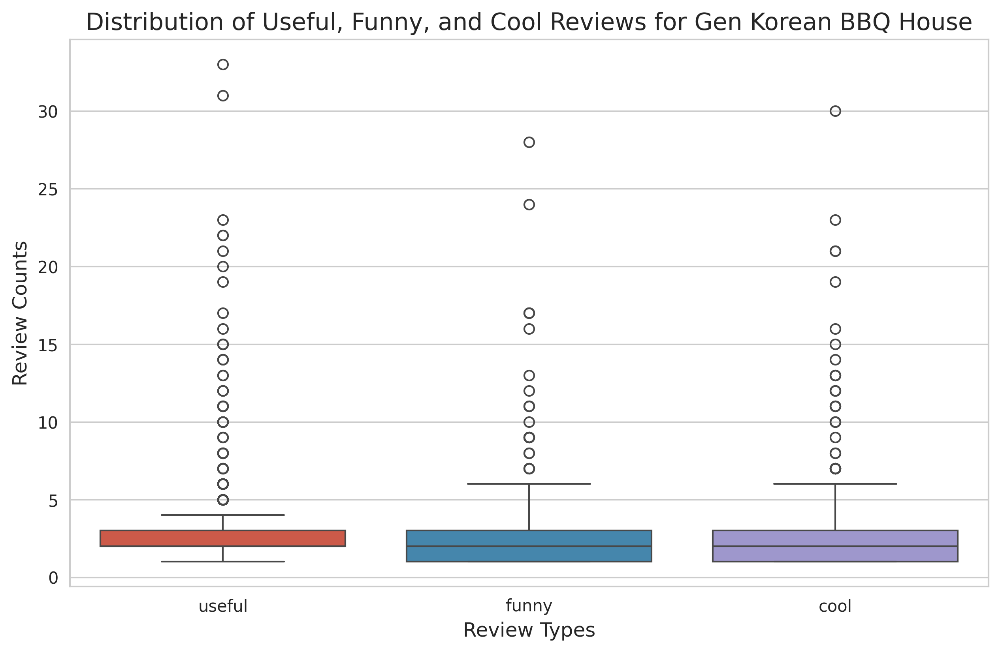

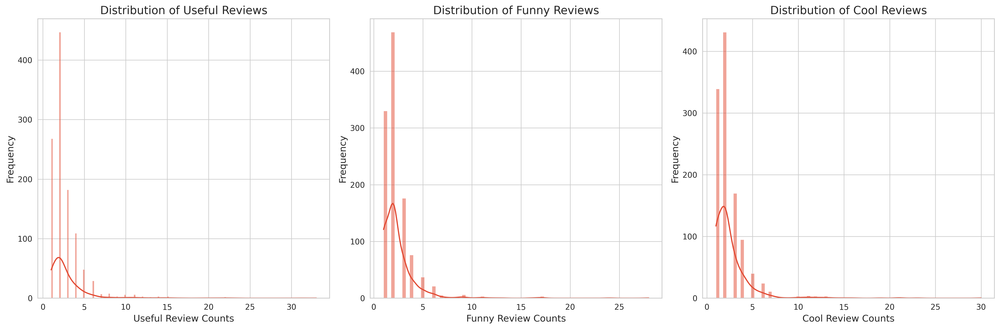

In [56]:
# Filter reviews for a specific business
selected_business = reviews[reviews['business_id'] == target_business_id]

# Select the columns to analyze
columns_to_plot = ['useful', 'funny', 'cool']
data_to_plot = selected_business[columns_to_plot]

# --- Boxplot: Compare distributions across review types ---
plt.figure(figsize=(10, 6))
sns.boxplot(data=data_to_plot)
plt.title('Distribution of Useful, Funny, and Cool Reviews for Gen Korean BBQ House')
plt.xlabel('Review Types')
plt.ylabel('Review Counts')
plt.show()

# --- Histograms: Show individual distributions in more detail ---
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for i, col in enumerate(columns_to_plot):
    sns.histplot(selected_business[col], ax=axes[i], kde=True)
    axes[i].set_title(f'Distribution of {col.capitalize()} Reviews')
    axes[i].set_xlabel(f'{col.capitalize()} Review Counts')
    axes[i].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


#### Word Cloud

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


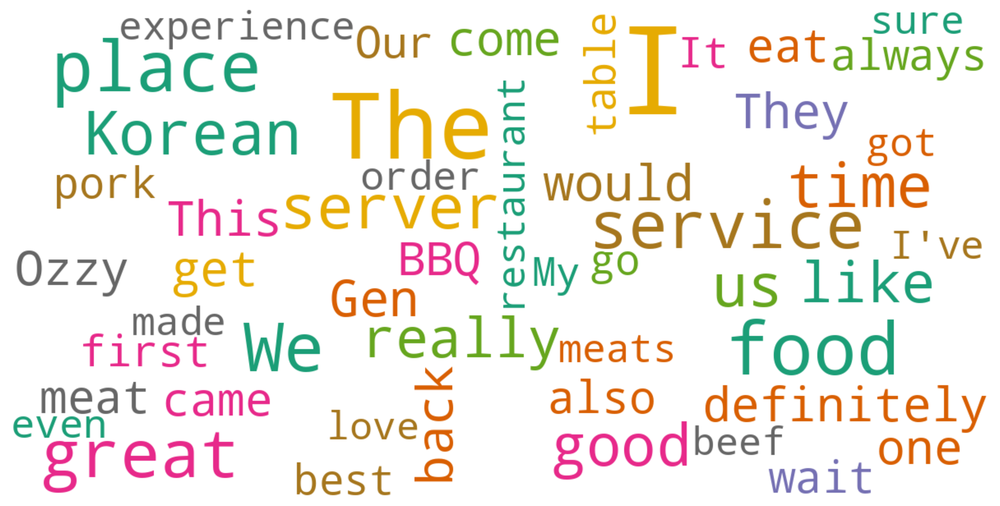

In [57]:
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Download stopwords
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

# Function to generate a word cloud from review text
def createWordCloud(train, topk=100, max_words=50):
    # Split text into individual words
    words = train['text'].str.split(expand=True).stack().reset_index(drop=True)

    # Remove common stopwords (e.g., "the", "and", "is")
    filtered_words = words[~words.isin(stop_words)]

    # Count the frequency of each word
    word_counts = filtered_words.value_counts().reset_index(name='n').rename(columns={'index': 'word'})

    # Select top K most frequent words
    topk_words = word_counts.head(topk)

    # Create the word cloud
    wordcloud = WordCloud(
        max_words=max_words,
        colormap='Dark2',
        width=1200,
        height=600,
        max_font_size=150,
        min_font_size=10,
        background_color='white',
        random_state=42,
        collocations=False  # Prevents combining of common word pairs
    ).generate_from_frequencies(dict(zip(topk_words['word'], topk_words['n'])))

    # Display the word cloud
    plt.figure(figsize=(15, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Filter reviews for the selected business
selected_reviews = reviews[reviews['business_id'] == target_business_id]

# Generate and display the word cloud
createWordCloud(selected_reviews)


#### Top Ten most common Words of the business

Implementation Steps:

1. **Filter Reviews for a Specific Business**  
   Select review data for a specific `business_id` from the main `DataFrame`.

2. **Tokenization**  
   Split each review into individual words for analysis.

3. **Stopword Removal**  
   Remove common words like "the", "and", "is" that do not carry meaningful content.

4. **Word Frequency Counting**  
   Count how many times each word appears in the reviews.

5. **Sort and Extract Top 10 Words**  
   Sort the words by frequency in descending order and select the top 10 most frequent ones.

In [59]:
import nltk
from nltk.corpus import stopwords
from collections import Counter

# Download English stopwords if not already available
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

def get_top_ten_words(reviews, target_business_id):
    # Filter reviews for the selected business
    selected_reviews = reviews[reviews['business_id'] == target_business_id]

    # Combine all review text into one large string
    all_text = ' '.join(selected_reviews['text'])

    # Tokenize and convert to lowercase
    words = all_text.lower().split()

    # Remove stopwords and non-alphabetic tokens
    filtered_words = [word for word in words if word.isalpha() and word not in stop_words]

    # Count word frequencies
    word_counts = Counter(filtered_words)

    # Return the top 10 most common words
    top_ten_words = word_counts.most_common(10)

    return top_ten_words

# Call the function and print results
top_ten = get_top_ten_words(reviews, target_business_id)
print(top_ten)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


[('food', 670), ('great', 623), ('service', 550), ('place', 549), ('korean', 446), ('server', 416), ('time', 407), ('good', 406), ('us', 385), ('like', 366)]


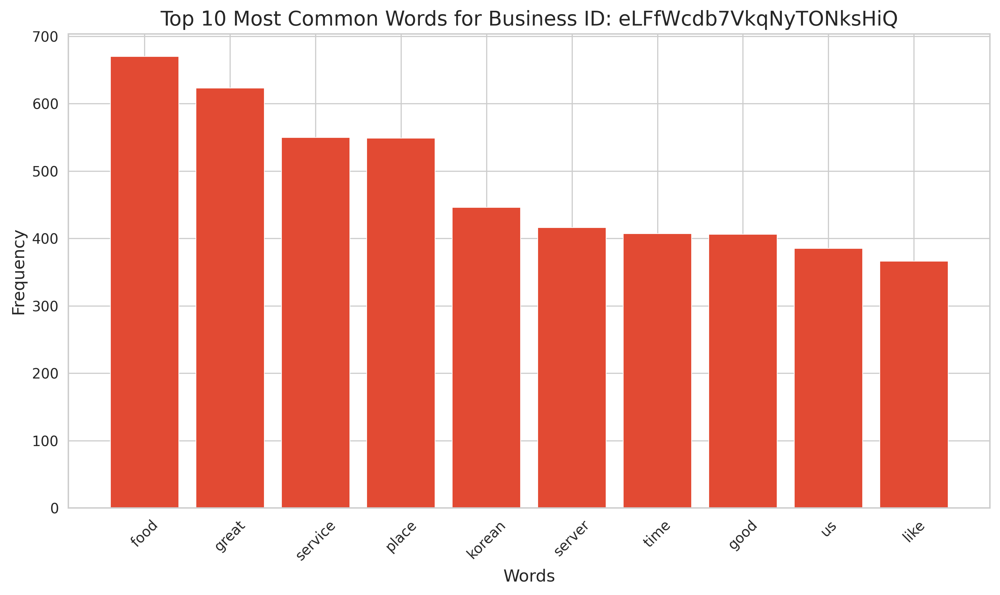

In [60]:
# Extract words and their frequencies from the top_ten list
words = [word for word, freq in top_ten]
frequencies = [freq for word, freq in top_ten]

# Set image resolution
plt.rcParams['figure.dpi'] = 300

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(words, frequencies)

# Add axis labels and title
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.title(f'Top 10 Most Common Words for Business ID: {target_business_id}')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Improve layout
plt.tight_layout()
plt.show()

#### Sentiment Analysis - Postive and Not So Postive Words

We use the **VADER (Valence Aware Dictionary and sEntiment Reasoner)** sentiment analysis tool from Python’s `nltk` library.  
VADER is specifically designed for sentiment analysis on social media and short texts, and is capable of assigning sentiment scores to individual words.

Implementation Steps:

1. **Data Preparation**  
   Filter the review dataset to include only reviews from a specific business.

2. **Tokenization**  
   Split the review text into individual words.

3. **Stopword Removal**  
   Remove common stopwords (e.g., “the”, “and”, “is”) that do not carry meaningful sentiment.

4. **Sentiment Scoring**  
   Use **VADER** to assign a sentiment score to each word.

5. **Word Classification**  
   Based on the sentiment score:
   - Words with **positive sentiment** are labeled as **positive words**.
   - All others (neutral or negative) are grouped separately.

This process helps isolate emotionally impactful words in customer reviews, giving a more granular view of public opinion toward a business.

In [61]:
import nltk
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Download required NLTK resources
nltk.download('stopwords')
nltk.download('vader_lexicon')

# Initialize stopwords and VADER sentiment analyzer
stop_words = set(stopwords.words('english'))
sia = SentimentIntensityAnalyzer()

def analyze_sentiment_words(reviews, target_business_id):
    # Step 1: Filter reviews for the selected business
    selected_reviews = reviews[reviews['business_id'] == target_business_id]

    # Step 2: Combine all review text into one large string
    all_text = ' '.join(selected_reviews['text'])

    # Step 3: Tokenize and clean words
    words = all_text.lower().split()
    filtered_words = [word for word in words if word.isalpha() and word not in stop_words]

    # Step 4: Classify words based on sentiment score
    positive_words = []
    non_positive_words = []
    for word in filtered_words:
        sentiment_score = sia.polarity_scores(word)['compound']
        if sentiment_score > 0.3:
            positive_words.append(word)
        elif sentiment_score < -0.3:
            non_positive_words.append(word)

    return positive_words, non_positive_words

# Run sentiment analysis for a specific business
positive, non_positive = analyze_sentiment_words(reviews, target_business_id)

# Output results
print("Positive Words:", positive)
print("Non-Positive Words:", non_positive)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


Positive Words: ['good', 'liked', 'party', 'friends', 'neatly', 'like', 'like', 'nice', 'fresh', 'delicious', 'definitely', 'favorite', 'love', 'like', 'super', 'great', 'romantic', 'kind', 'clear', 'sure', 'amazing', 'favorite', 'like', 'best', 'excited', 'party', 'innovative', 'ready', 'good', 'loved', 'like', 'applaud', 'definitely', 'great', 'enjoy', 'lively', 'friends', 'definitely', 'favorite', 'better', 'better', 'enjoy', 'wish', 'great', 'super', 'friendly', 'great', 'definitely', 'great', 'fresh', 'great', 'party', 'delicious', 'applause', 'good', 'happy', 'party', 'delicious', 'party', 'super', 'super', 'best', 'good', 'nice', 'free', 'like', 'good', 'wow', 'pleasure', 'best', 'loved', 'fun', 'thank', 'goodness', 'helpful', 'wish', 'love', 'truly', 'hope', 'thanks', 'great', 'amazing', 'satisfy', 'cool', 'help', 'great', 'definitely', 'recommend', 'love', 'loved', 'recommend', 'best', 'truly', 'like', 'perfect', 'like', 'favorites', 'like', 'like', 'like', 'recommend', 'great

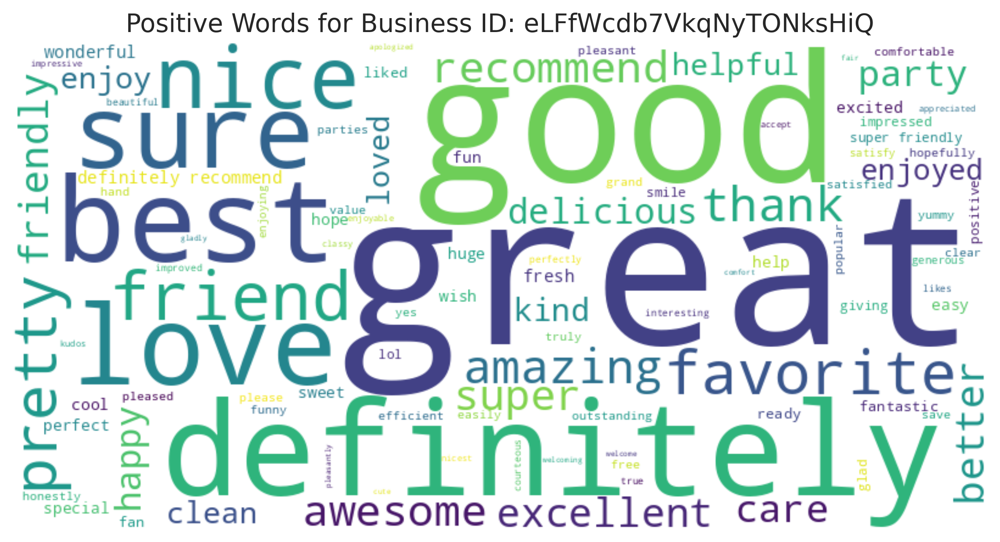

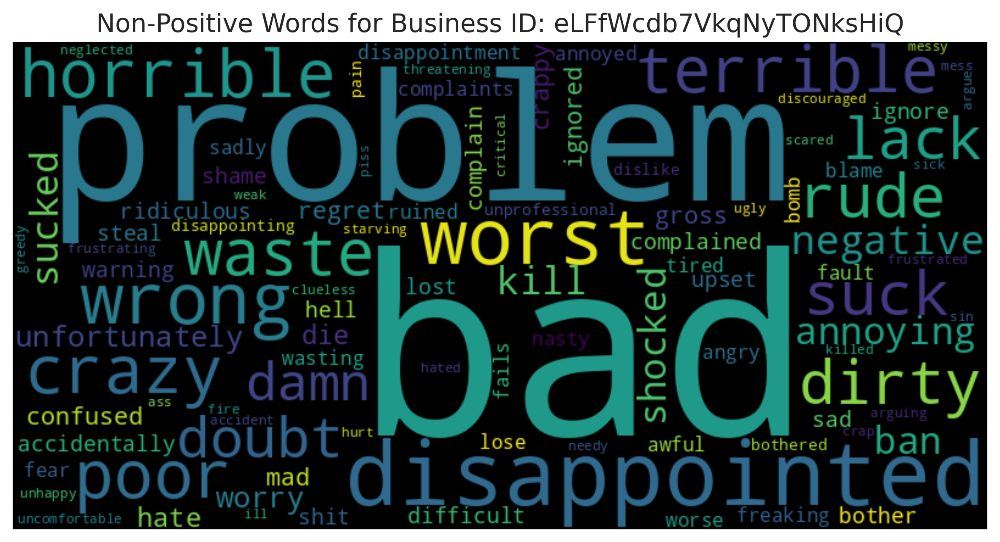

In [62]:
def generate_wordcloud(words, title, background_color='white'):
    # Convert list of words into a single string
    text = ' '.join(words)

    # Create a WordCloud object
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color=background_color,
        max_words=100,
        colormap='viridis'
    ).generate(text)

    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

# Generate word cloud for positive words
generate_wordcloud(positive, f'Positive Words for Business ID: {target_business_id}')

# Generate word cloud for non-positive words
generate_wordcloud(non_positive, f'Non-Positive Words for Business ID: {target_business_id}', background_color='black')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package sentiwordnet to /root/nltk_data...
[nltk_data]   Package sentiwordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


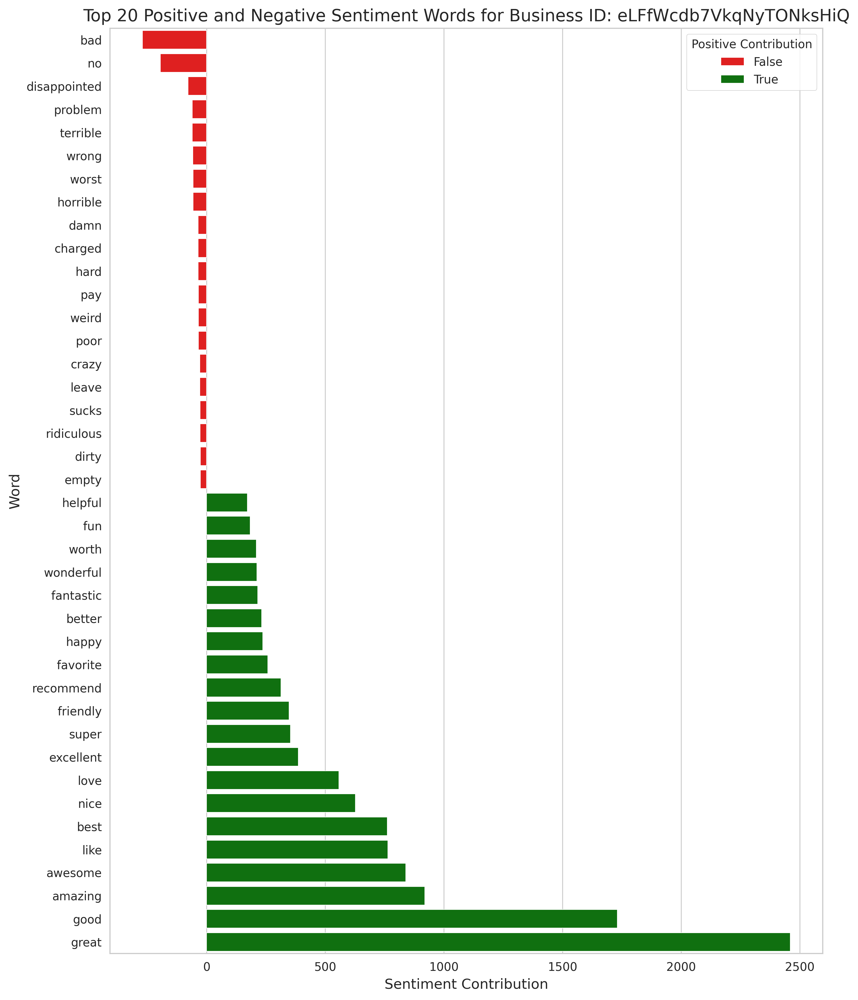

In [64]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize
import seaborn as sns
import matplotlib.pyplot as plt

# Download required NLTK data packages
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')  # Common English stopwords
nltk.download('wordnet')  # WordNet lexical database
nltk.download('omw-1.4')  # Multilingual WordNet
nltk.download('sentiwordnet')  # SentiWordNet for sentiment scores
nltk.download('averaged_perceptron_tagger')  # POS tagger

# Load AFINN sentiment dictionary
afinn_url = "https://raw.githubusercontent.com/fnielsen/afinn/master/afinn/data/AFINN-111.txt"
afinn = pd.read_csv(afinn_url, sep='\t', header=None, names=['word', 'score'])

# Define the function to analyze sentiment word contributions
def WordsContribution(reviews, target_business_id):
    # Step 1: Filter reviews for a specific business
    selected_reviews = reviews[reviews['business_id'] == target_business_id]

    # Step 2: Tokenize all review texts and count word frequencies
    all_words = []
    for text in selected_reviews['text']:
        words = word_tokenize(text.lower())
        all_words.extend(words)

    word_count = pd.Series(all_words).value_counts().reset_index(name='occurrences').rename(columns={'index': 'word'})

    # Step 3: Merge with AFINN sentiment scores
    contributions = pd.merge(word_count, afinn, on='word', how='inner')
    contributions['contribution'] = contributions['score'] * contributions['occurrences']

    # Step 4: Get top 20 words with the highest positive contribution
    top_positive = contributions[contributions['contribution'] > 0].nlargest(20, 'contribution')

    # Step 5: Get top 20 words with the highest negative contribution
    top_negative = contributions[contributions['contribution'] < 0].nsmallest(20, 'contribution')

    # Step 6: Combine both for visualization
    top_words = pd.concat([top_positive, top_negative])
    top_words = top_words.sort_values(by='contribution')

    # Step 7: Plot the results
    plt.figure(figsize=(10, 12))
    sns.barplot(
        x='contribution', y='word', data=top_words,
        hue=top_words['contribution'] > 0,
        dodge=False, palette={True: 'green', False: 'red'}
    )
    plt.legend(title='Positive Contribution', loc='upper right')
    plt.xlabel('Sentiment Contribution')
    plt.ylabel('Word')
    plt.title(f'Top 20 Positive and Negative Sentiment Words for Business ID: {target_business_id}')
    plt.tight_layout()
    plt.show()

# Call the function
WordsContribution(reviews, target_business_id)

#### Calculate Sentiment for the reviews

Implementation Steps:

1. **Load the AFINN Sentiment Lexicon**  
   Retrieve the AFINN dictionary either from a local file or an online source. This lexicon contains individual words along with their associated sentiment scores (ranging from -5 to +5).

2. **Tokenize and Score Each Review**  
   For each review:
   - Split the text into individual words (tokens)
   - Look up each word in the AFINN lexicon
   - Sum up the sentiment scores of all matched words to get the **overall sentiment score** for that review

3. **Sort and Display Top Results**  
   Sort all reviews by their computed sentiment score in descending order.  
   Display the top 6 reviews with their corresponding sentiment values to highlight the most positive entries.

In [65]:
# Load the AFINN sentiment lexicon
afinn_url = 'https://raw.githubusercontent.com/fnielsen/afinn/master/afinn/data/AFINN-111.txt'
afinn = pd.read_csv(afinn_url, sep='\t', header=None, names=['word', 'score'])

# Convert the lexicon to a dictionary for fast lookup
afinn_dict = afinn.set_index('word')['score'].to_dict()

def calculate_sentiment(review):
    """
    Calculate the sentiment score of a single review.

    :param review: The text content of a review.
    :return: Total sentiment score based on matched words from the AFINN lexicon.
    """
    # Tokenize the review
    words = word_tokenize(review.lower())

    # Sum sentiment scores for each word
    score = sum(afinn_dict.get(word, 0) for word in words)
    return score

def get_top_n_sentiments(reviews, topk=6):
    """
    Calculate sentiment scores for all reviews and return the top N based on sentiment.

    :param reviews: A DataFrame containing a 'text' column with review content.
    :param topk: Number of top reviews to return (default is 6).
    :return: A DataFrame with the top N reviews and their sentiment scores.
    """
    # Compute sentiment scores for each review
    reviews['sentiment_score'] = reviews['text'].apply(calculate_sentiment)

    # Sort by sentiment score in descending order
    sorted_reviews = reviews.sort_values(by='sentiment_score', ascending=False)

    # Return the top N reviews
    top_n = sorted_reviews.head(topk)
    return top_n

In [66]:
# Calculate sentiment scores and retrieve the top 6 most positive reviews
top_n = get_top_n_sentiments(reviews[reviews['business_id'] == target_business_id])

# Display the review text and their sentiment scores
print(top_n[['text', 'sentiment_score']])

                                                      text  sentiment_score
2886843  I came here after I seen that person below me ...               77
203303   Gen from outside the entrance looks like a rea...               74
1342861  I've waited a long time for a restaurant openi...               69
2790199  I'm being super generous with this review by g...               68
625787   There was a time I had given up on the KBBQ in...               61
3271872  Decided to try this place because my boyfriend...               56


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


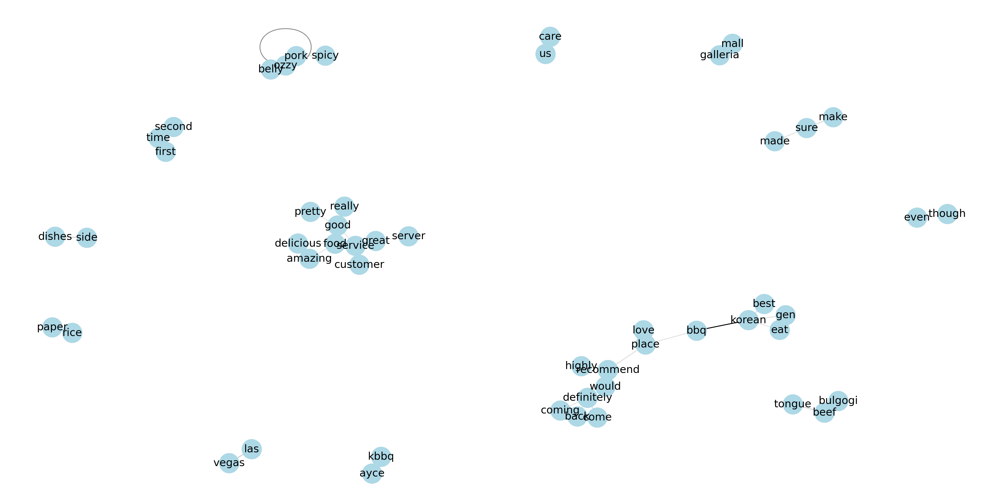

In [67]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import networkx as nx
import re
import nltk
import pandas as pd
import matplotlib.pyplot as plt

# Download required NLTK resources
nltk.download('punkt')
nltk.download('stopwords')

# Load English stopwords
stop_words = set(stopwords.words('english'))

def count_bigrams(dataset):
    """
    Count the most common bigrams (two-word combinations) from the review text.

    :param dataset: A DataFrame containing a 'text' column with reviews.
    :return: A DataFrame with bigram counts and the two individual words.
    """
    all_bigrams = []

    for text in dataset['text']:
        # Tokenize and lowercase
        tokens = word_tokenize(text.lower())

        # Remove stopwords and non-alphabetic tokens
        filtered_tokens = [word for word in tokens if re.match(r'^[a-z]+$', word) and word not in stop_words]

        # Generate bigrams
        current_bigrams = list(nltk.bigrams(filtered_tokens))
        all_bigrams.extend(current_bigrams)

    # Count bigram frequencies
    bigram_count = pd.Series(all_bigrams).value_counts().reset_index(name='n')
    bigram_count.columns = ['bigram', 'n']
    bigram_count[['word1', 'word2']] = pd.DataFrame(bigram_count['bigram'].tolist())
    bigram_count = bigram_count.sort_values(by='n', ascending=False)

    return bigram_count

def visualize_bigrams(bigrams):
    """
    Visualize bigram relationships using a network graph.

    :param bigrams: A DataFrame containing 'word1', 'word2', and 'n' (frequency).
    """
    # Create a graph from the bigram data
    G = nx.from_pandas_edgelist(bigrams, 'word1', 'word2', edge_attr='n')

    # Generate layout
    pos = nx.spring_layout(G)

    # Draw nodes
    nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=500)

    # Draw edges with transparency based on frequency
    for u, v, data in G.edges(data=True):
        nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], alpha=data['n'] / bigrams['n'].max())

    # Draw labels
    nx.draw_networkx_labels(G, pos)

    # Hide axes
    plt.axis('off')

    # Show plot
    plt.show()

# Filter reviews for a specific business
bigramsMonAmiGabi = count_bigrams(reviews[reviews['business_id'] == target_business_id])

# Filter for frequent bigrams (appearing more than 30 times)
bigrams_filtered = bigramsMonAmiGabi[bigramsMonAmiGabi['n'] > 30]

# Visualize the bigram network
visualize_bigrams(bigrams_filtered)

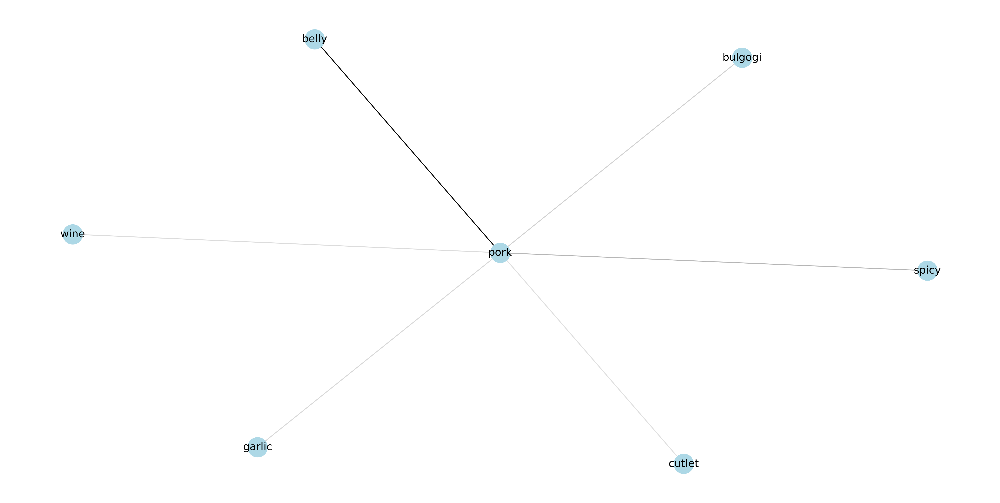

In [68]:
# Filter bigrams that contain the word "pork" and occur more than 10 times
bigrams_filtered = bigramsMonAmiGabi[
    ((bigramsMonAmiGabi['word1'] == "pork") | (bigramsMonAmiGabi['word2'] == "pork")) &
    (bigramsMonAmiGabi['n'] > 10)
]

# Visualize the filtered bigrams
visualize_bigrams(bigrams_filtered)

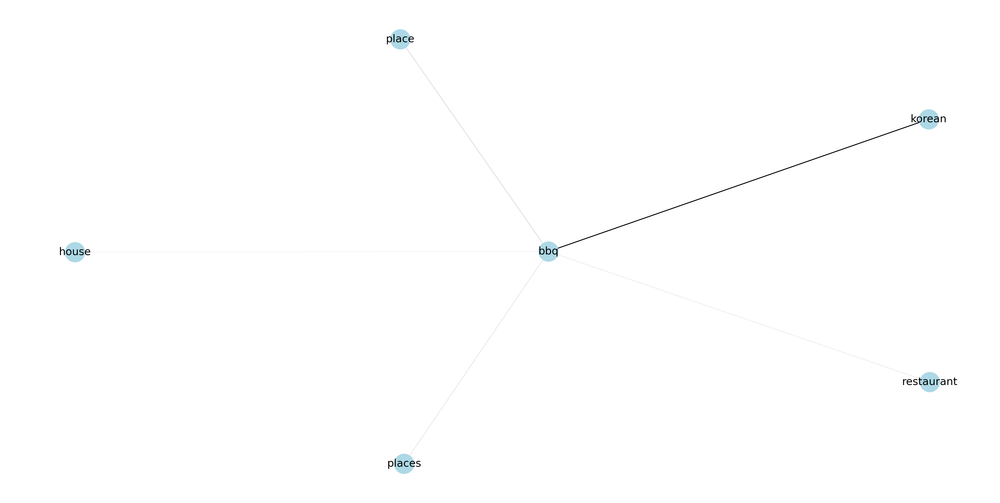

In [69]:
# Filter bigrams that contain the word "bbq" and occur more than 10 times
bigrams_filtered = bigramsMonAmiGabi[
    ((bigramsMonAmiGabi['word1'] == "bbq") | (bigramsMonAmiGabi['word2'] == "bbq")) &
    (bigramsMonAmiGabi['n'] > 10)
]

# Visualize the filtered bigrams
visualize_bigrams(bigrams_filtered)


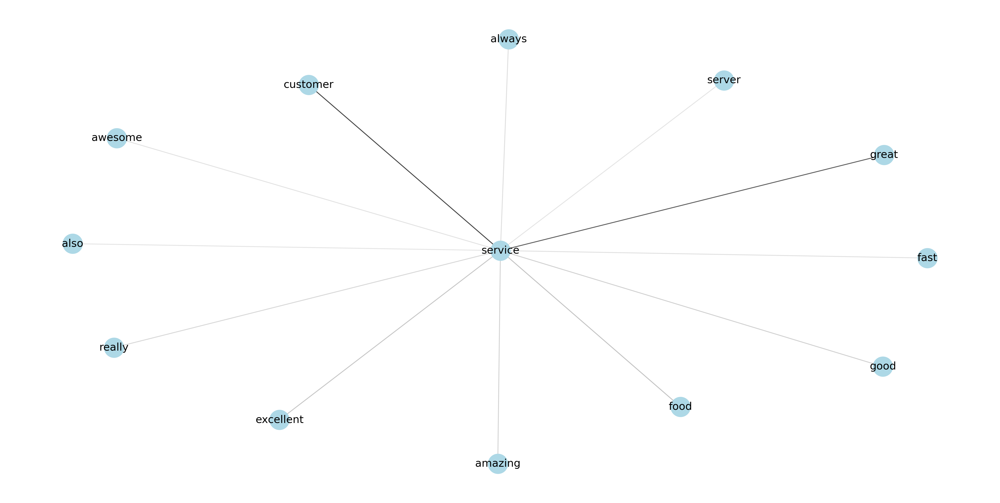

In [70]:
# Filter bigrams that contain the word "service" and occur more than 10 times
bigrams_filtered = bigramsMonAmiGabi[
    ((bigramsMonAmiGabi['word1'] == "service") | (bigramsMonAmiGabi['word2'] == "service")) &
    (bigramsMonAmiGabi['n'] > 10)
]

# Visualize the filtered bigrams
visualize_bigrams(bigrams_filtered)